# Data  Mining 2023 Assignment 2: Prediction of Cellular Composition


## Question 1

### Load the training and test data files and answer the following questions:

In [1]:
#necessary libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import random as random
from skimage.color import rgb2hed
import skimage
from skimage.io import imread
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error 
import math
from scipy import stats
from sklearn.svm import SVR
from sklearn.neural_network import MLPRegressor

#install and import PyTorch,tqdm and PCA 
!pip install torch
import torch as torch
import torch.nn as nn
import torch.nn.functional as fun
from sklearn.decomposition import PCA
!pip install tqdm
from tqdm import tqdm

#additional libraries
import torch.optim as optim
import numpy as np
from tabulate import tabulate
from skimage.transform import resize
from sklearn.metrics import mean_squared_error




In [2]:
#read images
X = np.load("images.npy")

#read cell counts
Y = pd.read_csv('counts.csv')


#read fold information
F = np.loadtxt('split.txt')

### (i) How many examples are there in each fold?

In [3]:
#number of examples in fold 1
F1=np.count_nonzero(F == 1)
print("Examples in Fold 1 =",F1)

#number of examples in fold 2
F2=np.count_nonzero(F == 2)
print("Examples in Fold 2 =",F2)

#number of examples in fold 3
F3=np.count_nonzero(F == 3)
print("Examples in Fold 3 =",F3)

Examples in Fold 1 = 1622
Examples in Fold 2 = 1751
Examples in Fold 3 = 1608


### (ii) Show some image examples using plt.imshow. Describe your observations on what you see in the images and how it correlates with the cell counts of different types of cells and the overall number of cells.

In [4]:
#adding a column of the total number of cells in each row
Y['total']= Y.iloc[:, -7:-1].sum(axis=1)

#renaming the columns
Y = Y.rename(columns={'neutrophil': 'T1', 
                        'epithelial': 'T2', 
                        'lymphocyte': 'T3',
                        'plasma': 'T4',
                        'eosinophil':'T5',
                        'connective':'T6',
                        'total':'T7'})


Index: 3090
T1     2
T2    91
T3     5
T4     0
T5     1
T6     4
T7    99
Name: 3090, dtype: int64


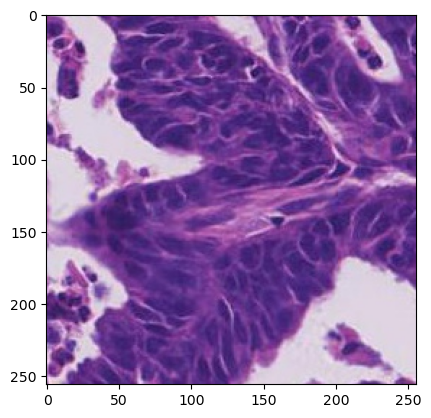

Index: 4740
T1      0
T2     49
T3     48
T4     27
T5      1
T6      7
T7    125
Name: 4740, dtype: int64


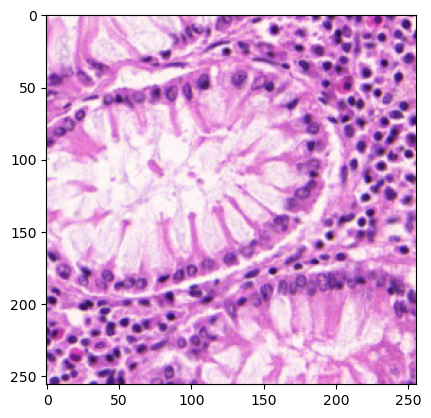

Index: 570
T1     0
T2    37
T3     1
T4     1
T5     0
T6     3
T7    39
Name: 570, dtype: int64


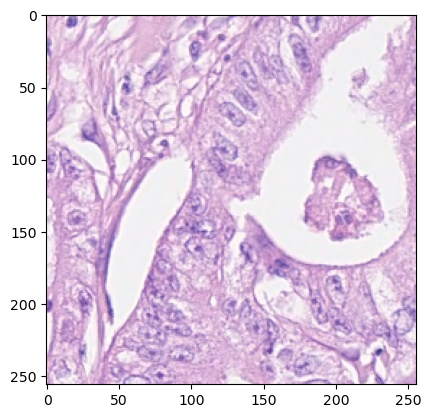

Index: 842
T1     1
T2    15
T3     5
T4     0
T5     0
T6    51
T7    21
Name: 842, dtype: int64


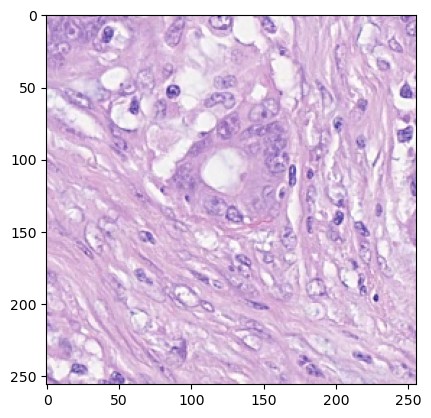

Index: 675
T1     2
T2    42
T3     0
T4     0
T5     0
T6     2
T7    44
Name: 675, dtype: int64


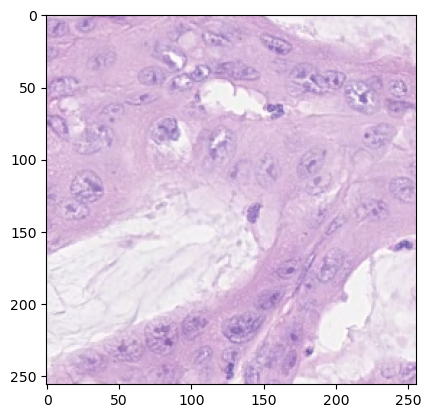

Index: 3157
T1      0
T2     34
T3     90
T4      1
T5      0
T6     33
T7    125
Name: 3157, dtype: int64


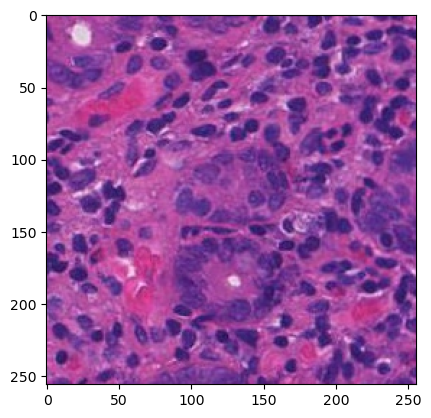

Index: 305
T1      1
T2     87
T3     47
T4      7
T5      1
T6     20
T7    143
Name: 305, dtype: int64


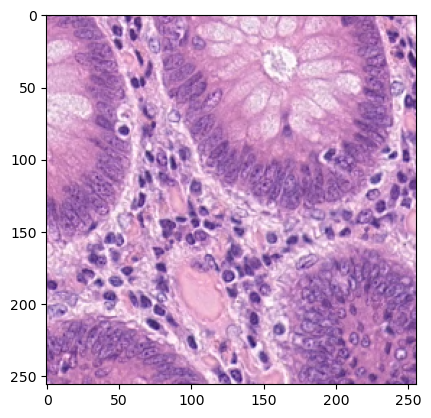

Index: 1456
T1     3
T2    50
T3     2
T4     1
T5     0
T6    12
T7    56
Name: 1456, dtype: int64


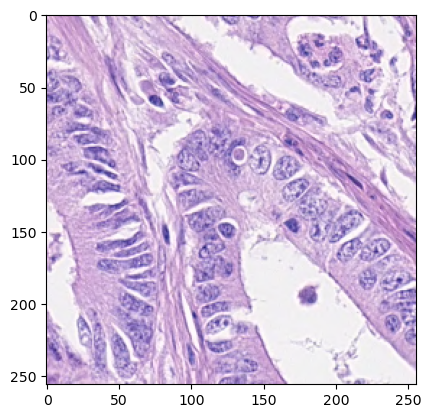

Index: 176
T1     0
T2    25
T3    16
T4     7
T5     1
T6    45
T7    49
Name: 176, dtype: int64


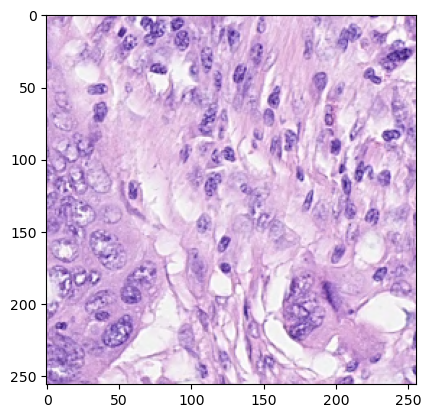

Index: 3624
T1     0
T2    43
T3    10
T4     3
T5     0
T6    13
T7    56
Name: 3624, dtype: int64


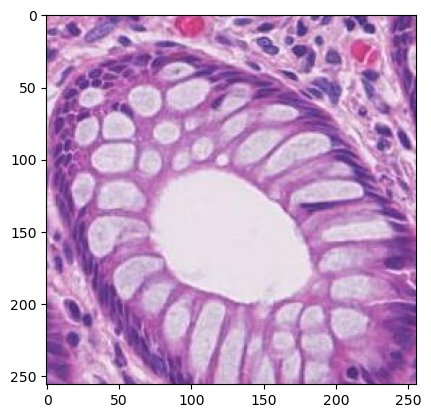

In [107]:
#selecting 10 random images and printing them with the cell counts and the overall cells

for i in random.sample(range(len(X)),10): 
    plt.imshow(X[i]) 
    print("Index:", i)
    print(Y.iloc[i])
    plt.show()

### Ans. We observe that the cells T1 are absent from the instances chosen at random. T3 are clearly purple in colour and seem to be little. T5 cells are much less common than the other types of cells. T2 apperas to be hollow. 

### (iii) For each fold, plot the histogram of counts of each cell type separately as well as the total number of cells (7 plots in total). How many images have counts within each of the following bins?

/Users/khush/opt/anaconda3/envs/datamining/lib/python3.9/site-packages/matplotlib/axes/_axes.py:6826: RuntimeWarning: invalid value encountered in multiply
  boffset = -0.5 * dr * totwidth * (1 - 1 / nx)


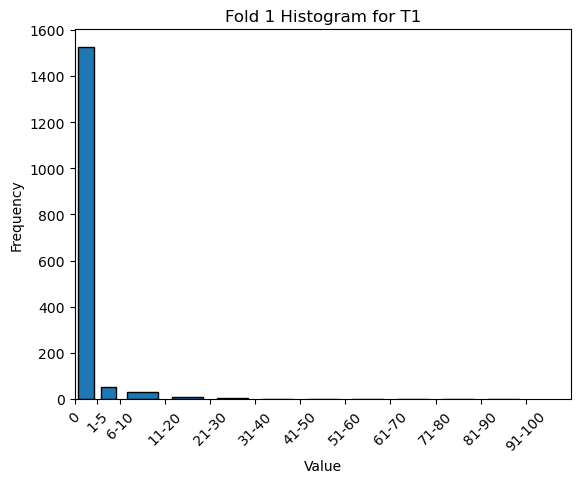

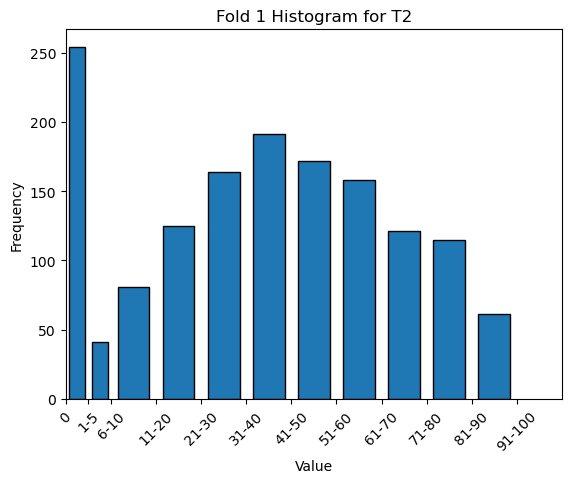

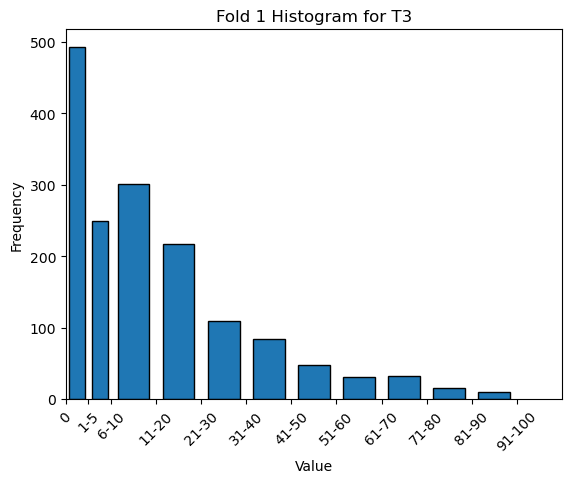

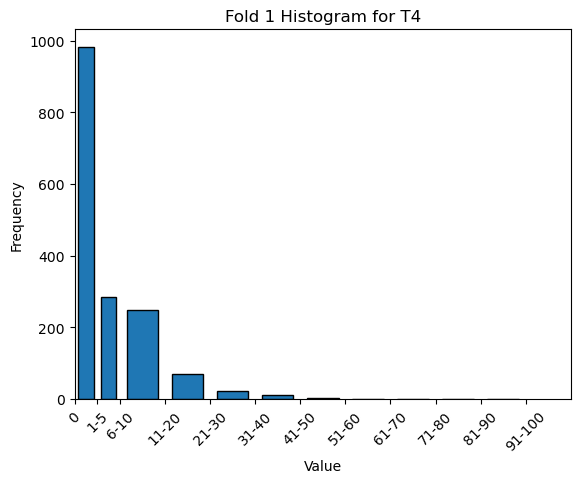

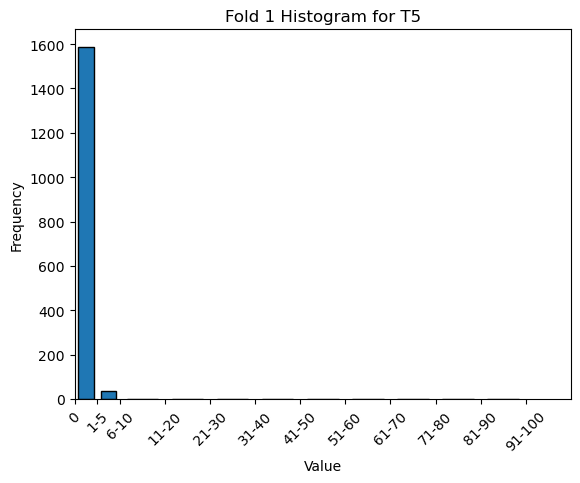

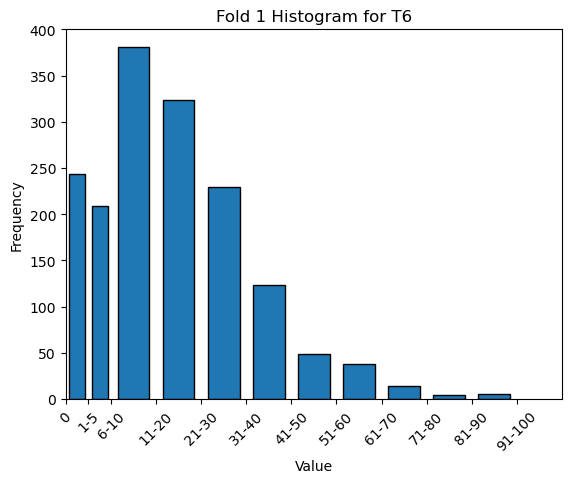

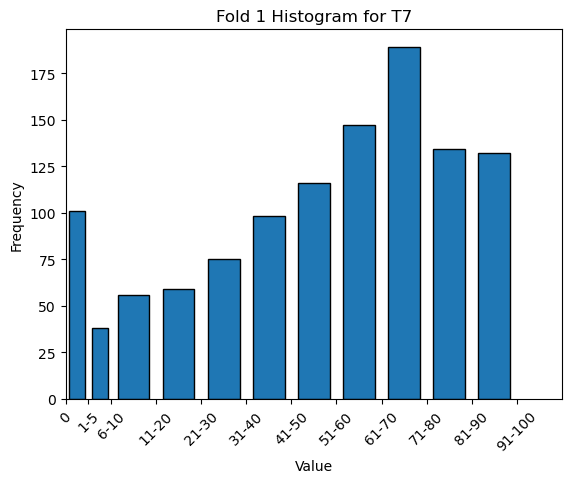

In [108]:
#Histograms for Fold 1

#define bin edges and labels
bin_edges = [0, 5, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100, float('inf')]
bin_labels = ['0', '1-5', '6-10', '11-20', '21-30', '31-40', '41-50', '51-60', '61-70', '71-80', '81-90', '91-100', '>100']

#loop over columns of Y and create histograms
for i in range(Y.shape[1]):
    
    #select values for current column and fold 1
    values = Y.iloc[F == 1, i]
    
    #create histogram
    plt.hist(values, bins=bin_edges, ec='black', rwidth=0.7)
    
    #set the x-axis tick labels to the bin labels
    plt.xticks(bin_edges, bin_labels,rotation=45)
    
    #add labels and title
    plt.xlabel('Value')
    plt.xlim(0, 110)
    plt.ylabel('Frequency')
    plt.title(f'Fold 1 Histogram for T{i+1}')
    
    #show the plot
    plt.show()


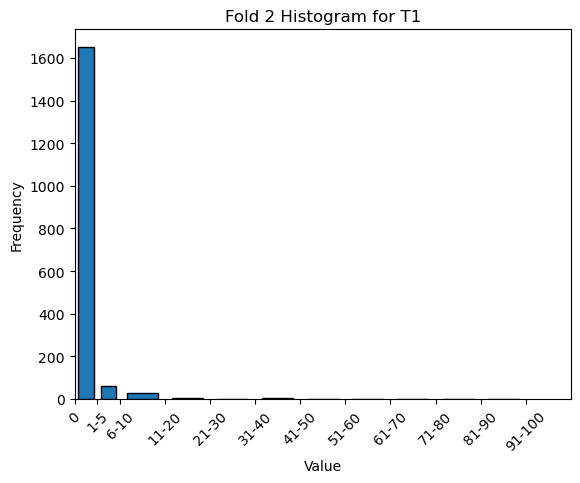

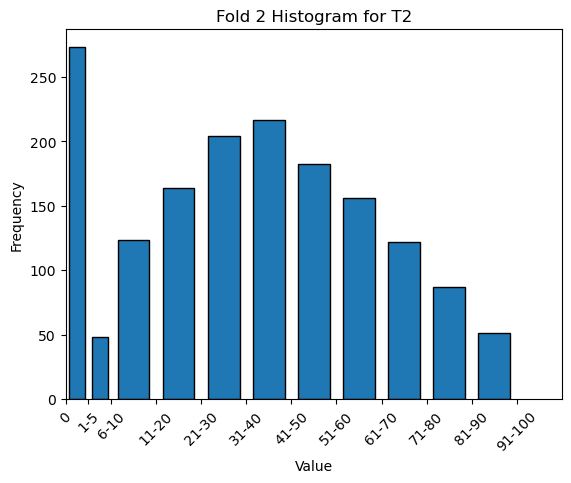

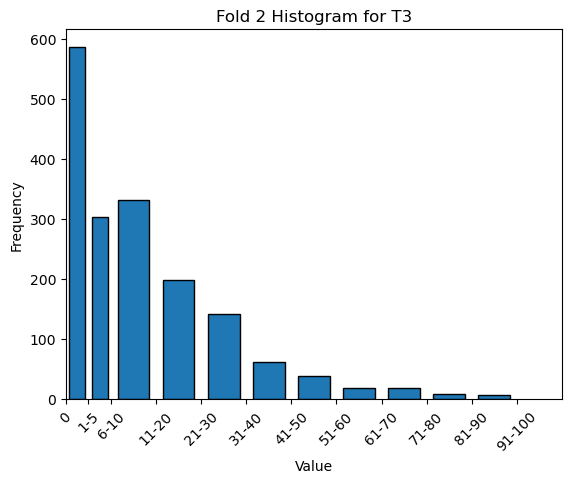

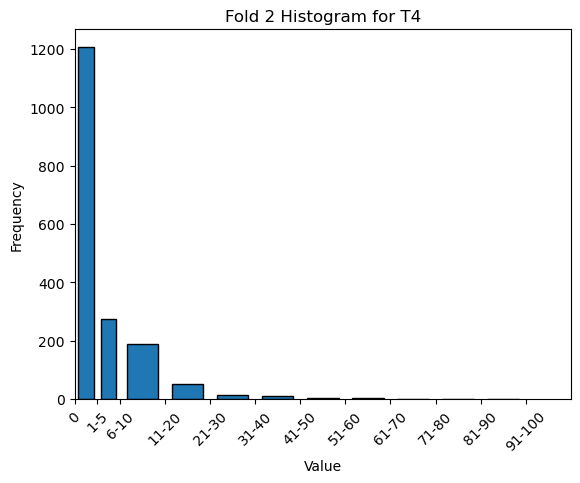

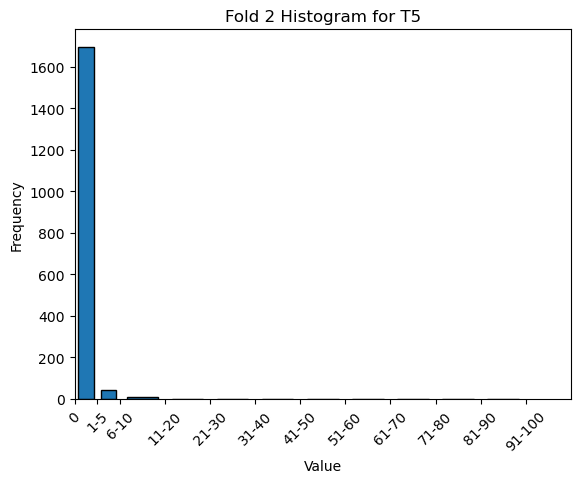

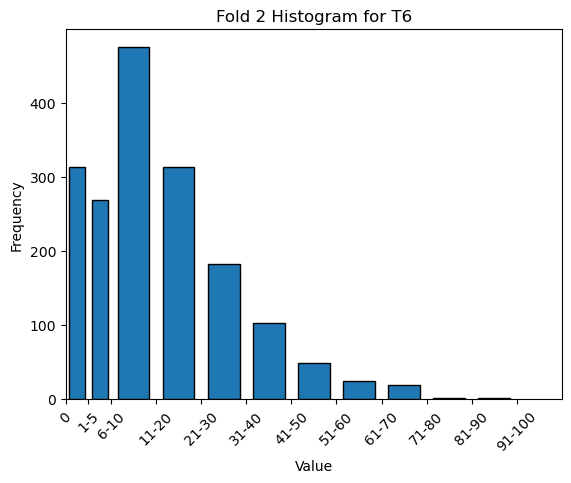

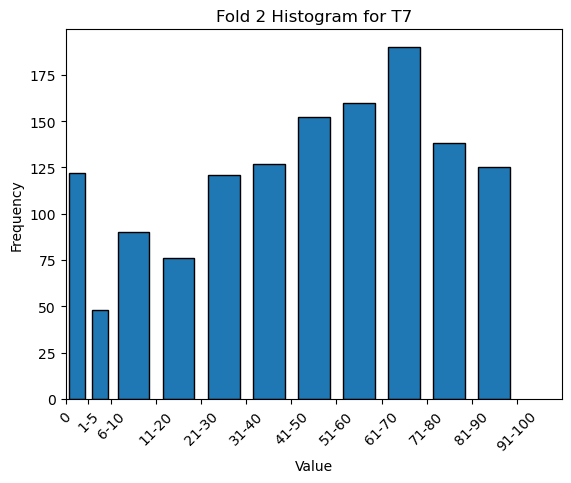

In [109]:
#Histograms for Fold 2

#define bin edges and labels
bin_edges = [0, 5, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100, float('inf')]
bin_labels = ['0', '1-5', '6-10', '11-20', '21-30', '31-40', '41-50', '51-60', '61-70', '71-80', '81-90', '91-100', '>100']

#loop over columns of Y and create histograms
for i in range(Y.shape[1]):
    #select values for current column and fold 1
    values = Y.iloc[F == 2, i]
    
    #create histogram
    plt.hist(values, bins=bin_edges, ec='black', rwidth=0.7)
    
    #set the x-axis tick labels to the bin labels
    plt.xticks(bin_edges, bin_labels,rotation=45)
    
    #add labels and title
    plt.xlabel('Value')
    plt.xlim(0, 110)
    plt.ylabel('Frequency')
    plt.title(f'Fold 2 Histogram for T{i+1}')
    
    #show the plot
    plt.show()


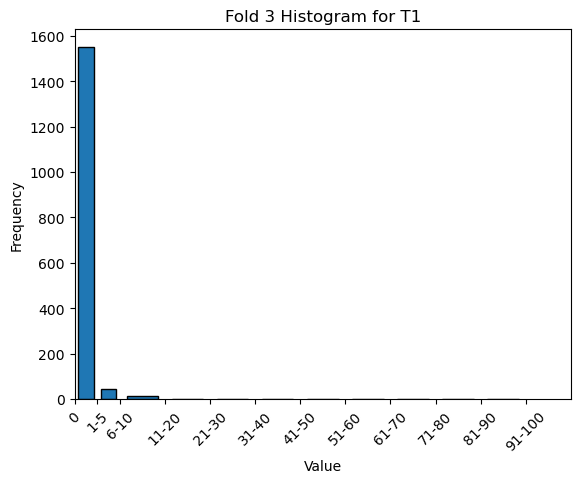

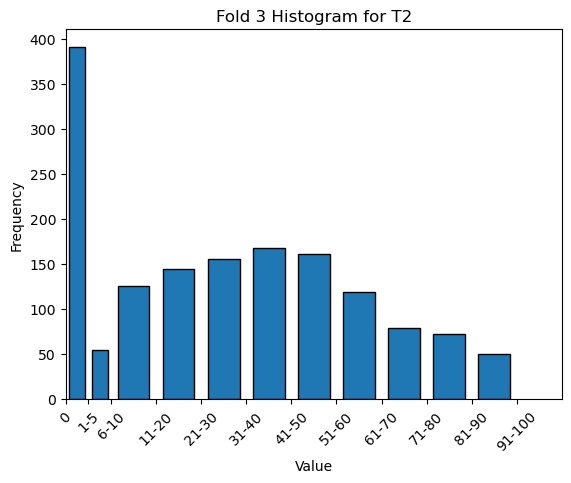

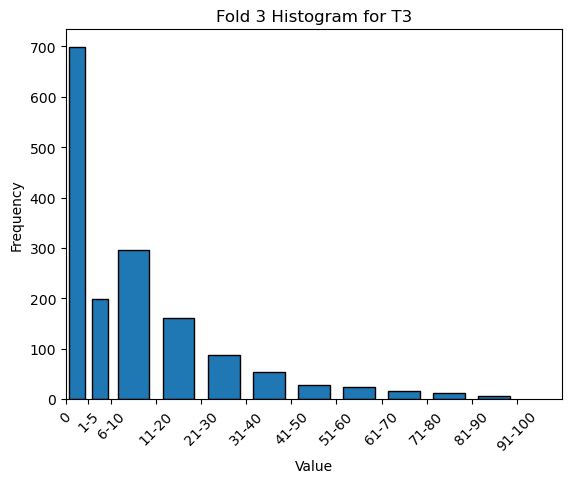

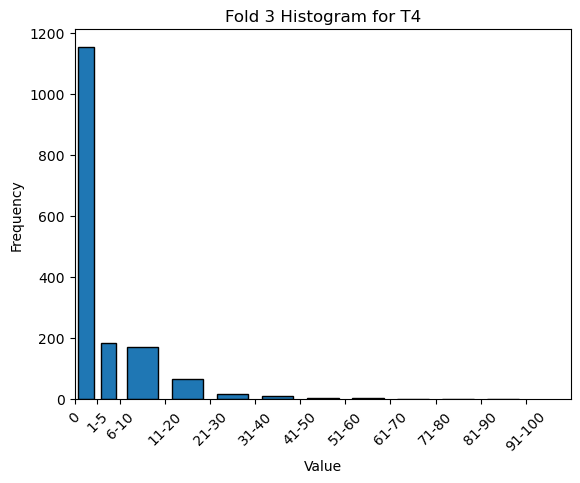

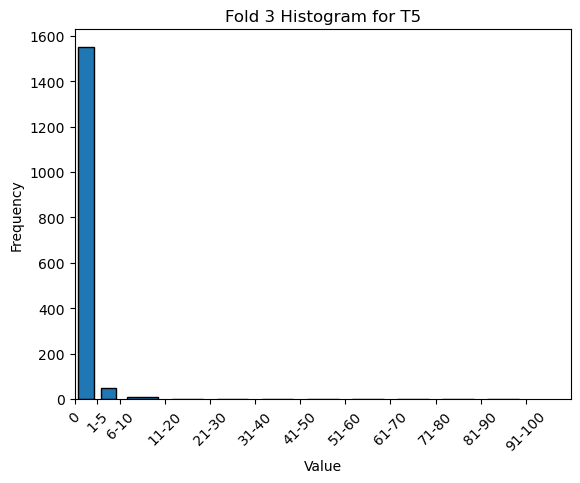

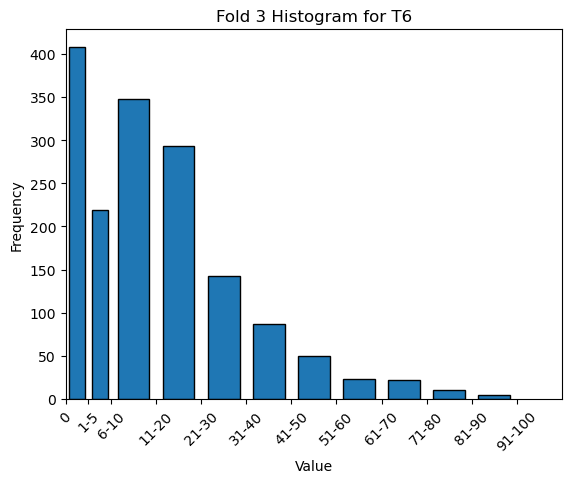

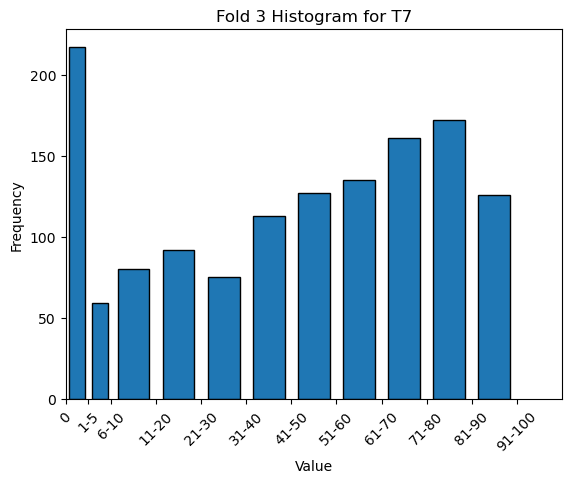

In [110]:
#Histograms for Fold 3

#define bin edges and labels
bin_edges = [0, 5, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100, float('inf')]
bin_labels = ['0', '1-5', '6-10', '11-20', '21-30', '31-40', '41-50', '51-60', '61-70', '71-80', '81-90', '91-100', '>100']

#loop over columns of Y and create histograms
for i in range(Y.shape[1]):
    # Select values for current column and fold 3
    values = Y.iloc[F == 3, i]
    
    #create histogram
    plt.hist(values, bins=bin_edges, ec='black', rwidth=0.7)
    
    #set the x-axis tick labels to the bin labels
    plt.xticks(bin_edges, bin_labels,rotation=45)
    
    #add labels and title
    plt.xlabel('Value')
    plt.xlim(0, 110)
    plt.ylabel('Frequency')
    plt.title(f'Fold 3 Histogram for T{i+1}')
    
    #show the plot
    plt.show()


### (iv) Pre-processing: Convert and show a few images from RGB space to HED space and show the H-channel which should indicate cellular nuclei. For this purpose, you can use the color separation notebook available here: https://scikit-image.org/docs/dev/auto_examples/color_exposure/plot_ihc_color_separation.html

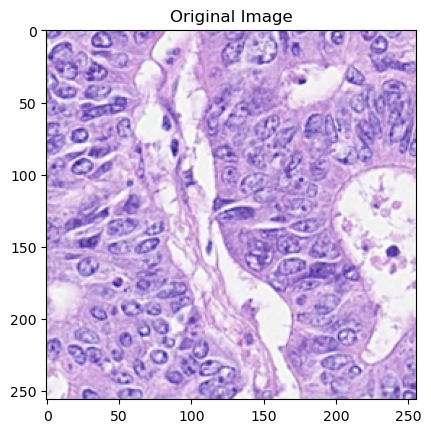

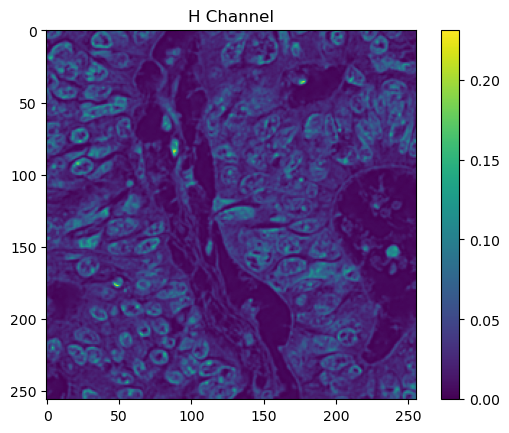

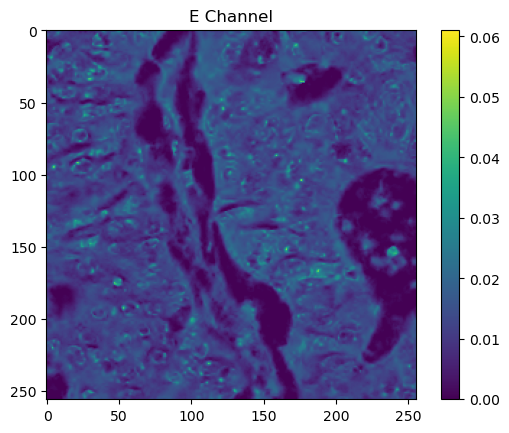

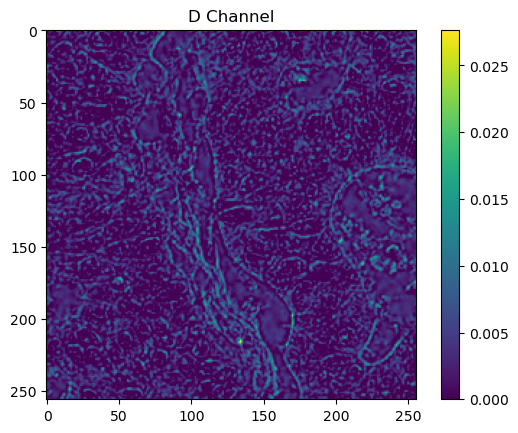

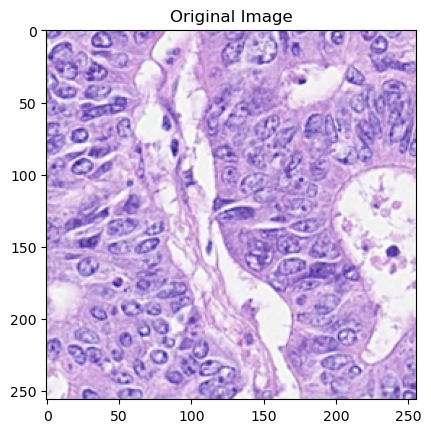

...

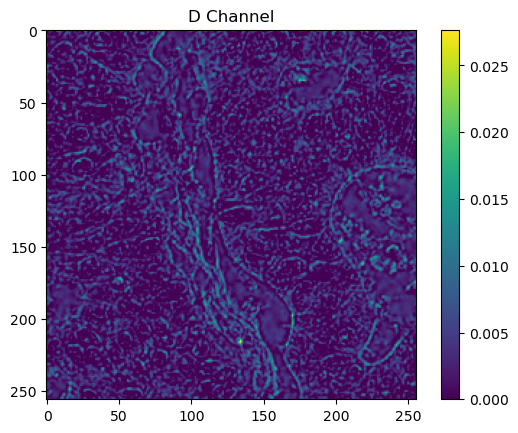

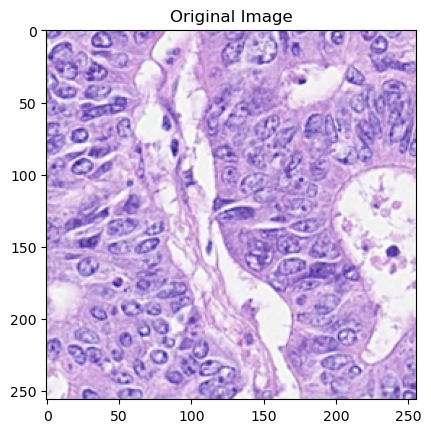

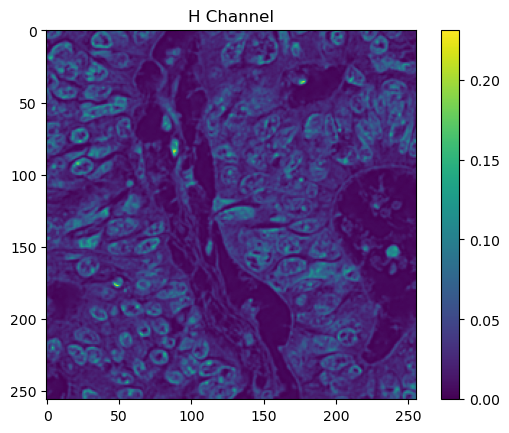

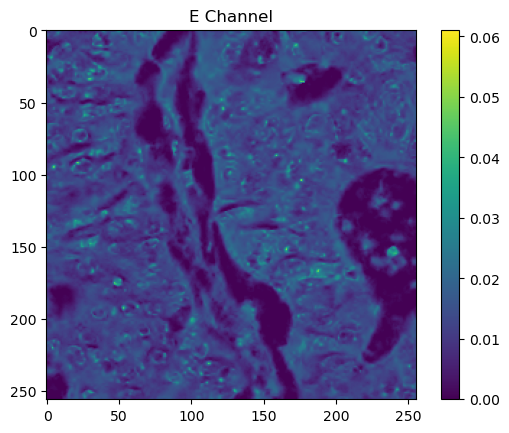

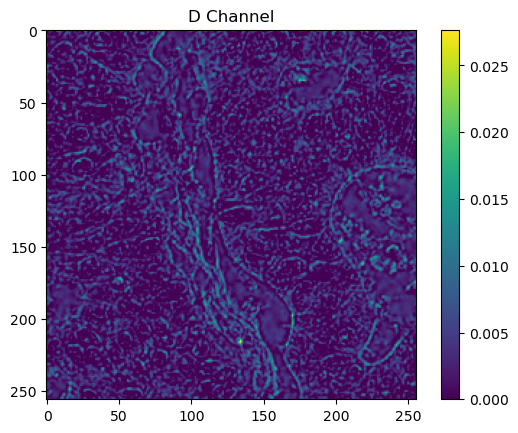

In [111]:
#selecting 5 random images
for i in random.sample(range(len(X)), 5):
    
    #read sample image and rescale pixel range in it
    I = X[0]/255.0 
    
    #convert to HED
    I_hed =  rgb2hed(I) 
    
    #plotting the original image
    plt.imshow(I);plt.title('Original Image');plt.show() 
    
    #plotting the H channel
    I_h = I_hed[:,:,0]; plt.figure(); plt.imshow(I_h);plt.colorbar();plt.title('H Channel');plt.show() 
    
    #plotting the E channel 
    I_e = I_hed[:,:,1]; plt.figure();  plt.imshow(I_e);plt.colorbar();plt.title('E Channel');plt.show()
    
    #plotting the D channel 
    I_d = I_hed[:,:,2]; plt.figure();  plt.imshow(I_d);plt.colorbar();plt.title('D Channel');plt.show()  

### (v) Do a scatter plot of the average of the H-channel for each image vs. its cell count of a certain type and the total number of cells for images in Fold-1 (7 plots in total). Do you think this feature would be useful in your regression model? Explain your reasoning. 

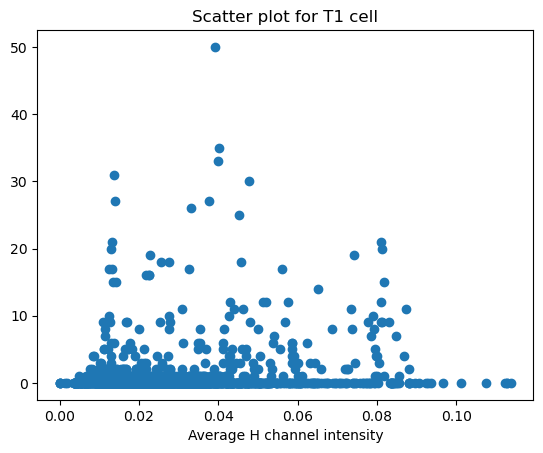

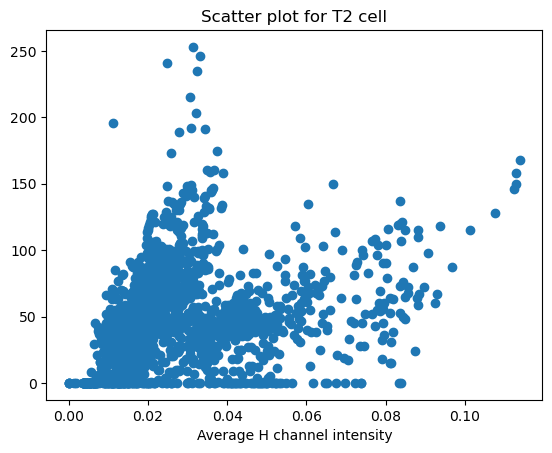

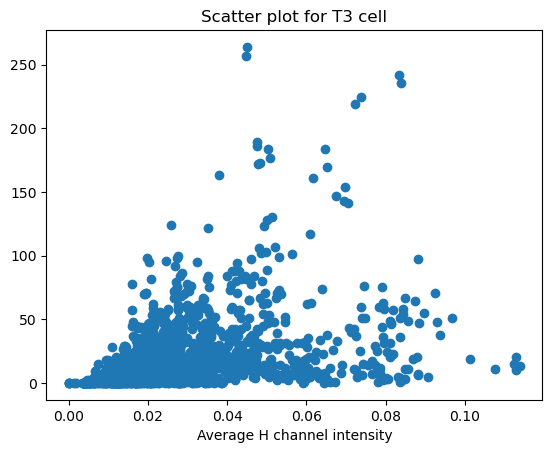

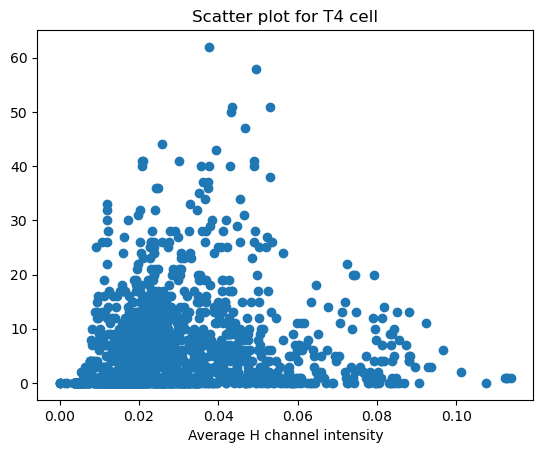

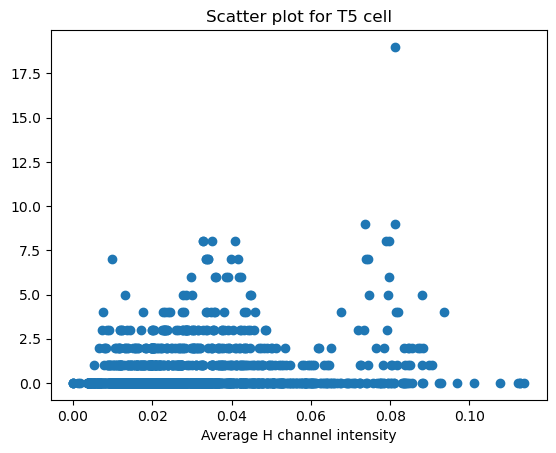

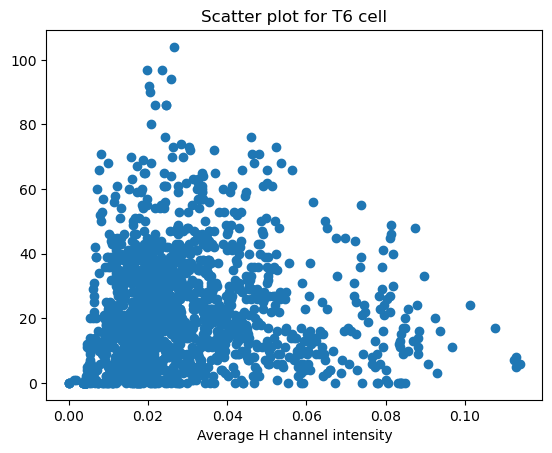

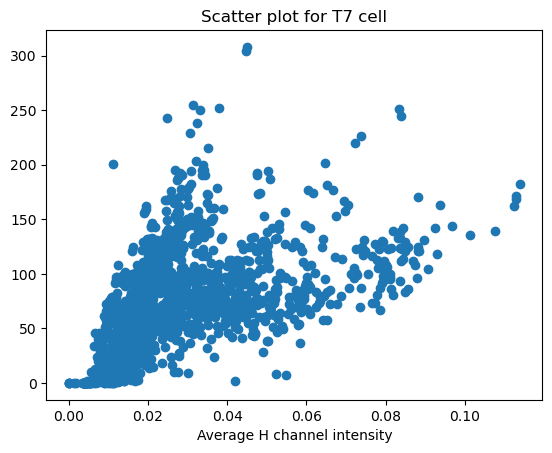

In [112]:
#creating a list for the average pf channle H for all folds 
H_avg = []

for idx, image in enumerate(F):
    I_hed =  rgb2hed(X[idx])
    I_h = I_hed[:,:,0]
    avg = np.mean(I_h)
    H_avg.append(avg)

#appending the average to the list
H_avg = np.array(H_avg)

#scatter plots for all 7 cells
for i in range(Y.shape[1]):
    
    #select values for current column and fold 1
    values = Y.iloc[F == 1, i]
    
    #select corresponding H_avg values
    h_values = H_avg[F == 1]
    plt.scatter(h_values, values)
    plt.title(f"Scatter plot for T{i+1} cell")
    plt.xlabel('Average H channel intensity')
    plt.show()


### Ans. Scatter plots between the average H channel for fold 1 and cells T1 and T5 have no correlation. For cells T2 and T3 there is some correlation. Hence, it may be useful for our regression model.

### (vi) What performance metrics can you use for this problem? Which one will be the best performance metric for this problem? Please give your reasoning.

### Ans. We use a Regression model which generally has the following performance metrics
### - Mean Squared Error (MSE): Its definition is the square root of the mean or average of the difference between actual and estimated values.
### - Root Mean Squared Error (RMSE): It calculates the average difference between values that a model predicts and actual values.
### - Mean Absolute Error (MAE): It is calculated by averaging the absolute difference between the actual values and the predicted values over the dataset.

### For this problem, since we are finding a model that best fits the data, we will be using R2, which is the coefficient of determination.

## Question 2

### (i) Extract features from a given image. Specifically, calculate the: 


### (a) average of the “H”, red, green and blue channels 

In [113]:
#selecting indices of Y where fold is 1 and 2
fold_1_2_indices = np.where((F == 1) | (F == 2))[0]

#selecting the last column with the total cells corresponding to fold 1 and 2
Y12 = Y.iloc[fold_1_2_indices,6].to_numpy()

In [114]:
#list for average intensity of H channel corresponding to fold 1 and 2 
avg_H12 = []

#loop through arrays of fold indices and images
for idx, f in enumerate(F):
    if f == 1 or f == 2:
        
        #convert the image to the HED color space
        I_hed =  rgb2hed(X[idx])
        
        #extract the H channel
        I_h = I_hed[:,:,0]
        
        #average intensity value of the H channel
        avg12 = np.mean(I_h)
        
        #append the values to the list
        avg_H12.append(avg12)
    


In [115]:
#correlation coefficient of the average intensity of H channel and Y folds 1 and 2
corr_avg_H12 = np.corrcoef(avg_H12, Y12)[0, 1]
print(f"Correlation between average H channel intensity and Y12: {corr_avg_H12}")

Correlation between average H channel intensity and Y12: 0.45527213945792366


In [116]:
#function to compute the average intensity of a channel in an RGB image
def average_channel_intensity(image, channel):
    
    #dictionary to map channel names to indices
    channel_dict = {"R": 2, "G": 1, "B": 0}
    
    #index of the specified channel
    channel_idx = channel_dict[channel]
    
    #extract the intensities of the specified channel from the image
    channel_intensities = np.array([row[:, channel_idx] for row in image]).flatten()
    
    #return the average intensity of the specified channel
    return np.mean(channel_intensities)

In [117]:
#list for average intensity of R channel corresponding to fold 1 and 2 
avg_R12=[]

#loop through arrays of fold indices and images
for idx, f in enumerate(F):
    if f == 1 or f == 2:
        
        #average intensity value of the R channel
        avg_r12 = average_channel_intensity(X[idx], "R")
        
        #append the values to the list
        avg_R12.append(avg_r12)

In [17]:
#correlation coefficient of the average intensity of R channel and Y folds 1 and 2
corr_avg_R12 = np.corrcoef(avg_R12, Y12)[0, 1]
print(f"Correlation between average R channel inte
      nsity and Y12: {corr_avg_R12}")

Correlation between average R channel intensity and Y12: -0.4649441730076816


In [118]:
#list for average intensity of G channel corresponding to fold 1 and 2 
avg_G12=[]

#loop through arrays of fold indices and images
for idx, f in enumerate(F):
    if f == 1 or f == 2:
        
        #average intensity value of the G channel
        avg_g12 = average_channel_intensity(X[idx], "G")
        
        #append the values to the list
        avg_G12.append(avg_g12)

In [119]:
#correlation coefficient of the average intensity of G channel and Y folds 1 and 2
corr_avg_G12 = np.corrcoef(avg_G12, Y12)[0, 1]
print(f"Correlation between average R channel intensity and Y12: {corr_avg_G12}")

Correlation between average R channel intensity and Y12: -0.5633573492837668


In [120]:
#list for average intensity of B channel corresponding to fold 1 and 2 
avg_B12=[]

#loop through arrays of fold indices and images
for idx, f in enumerate(F):
    if f == 1 or f == 2:
        
        #average intensity value of the B channel
        avg_b12 = average_channel_intensity(X[idx], "B")
        
        #append the values to the list
        avg_B12.append(avg_b12)

In [121]:
#correlation coefficient of the average intensity of B channel and Y folds 1 and 2
corr_avg_B12 = np.corrcoef(avg_B12, Y12)[0, 1]
print(f"Correlation between average R channel intensity and Y12: {corr_avg_B12}")

Correlation between average R channel intensity and Y12: -0.4973303184678528


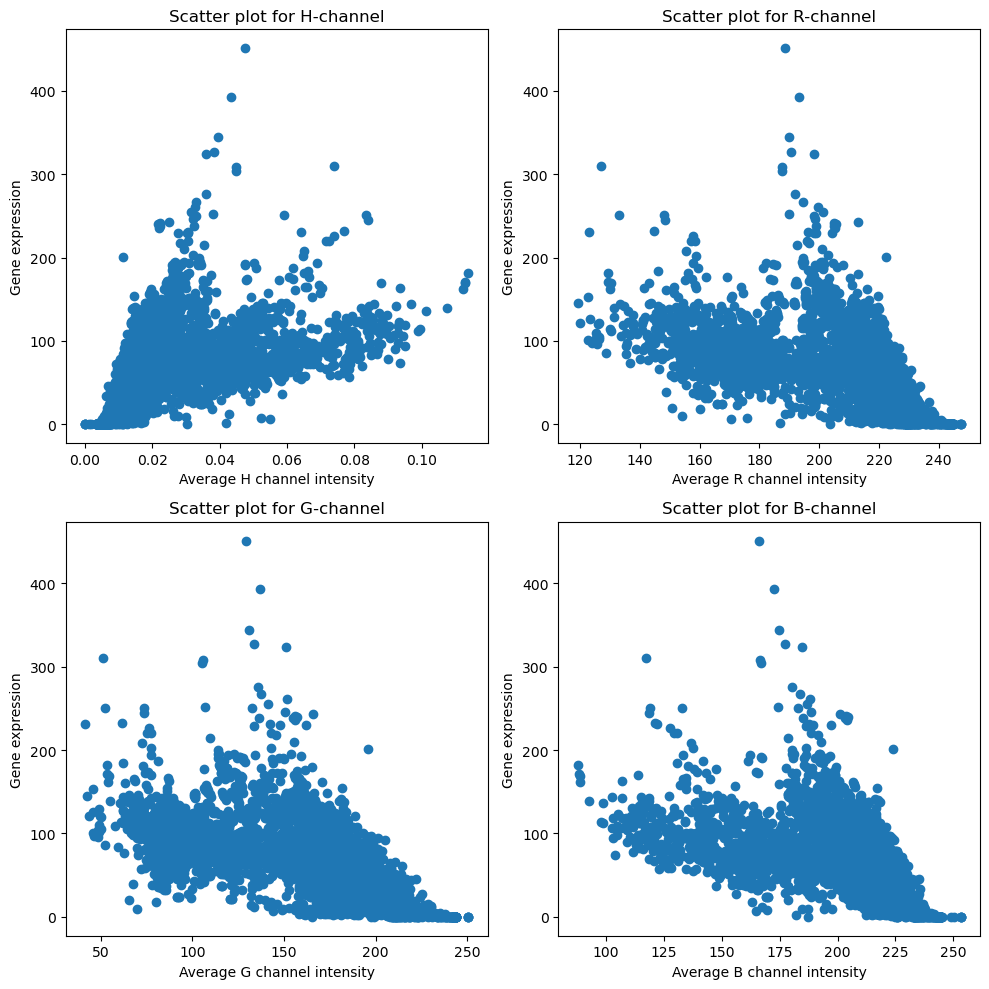

In [122]:
#create subplots with 2 rows and 2 columns
fig, axs = plt.subplots(2, 2, figsize=(10, 10))

#plot scatter for H-channel in first subplot
axs[0, 0].scatter(avg_H12, Y12)
axs[0, 0].set_title("Scatter plot for H-channel")
axs[0, 0].set_xlabel('Average H channel intensity')
axs[0, 0].set_ylabel('Gene expression')

#plot scatter for R-channel in second subplot
axs[0, 1].scatter(avg_R12, Y12)
axs[0, 1].set_title("Scatter plot for R-channel")
axs[0, 1].set_xlabel('Average R channel intensity')
axs[0, 1].set_ylabel('Gene expression')

#plot scatter for G-channel in third subplot
axs[1, 0].scatter(avg_G12, Y12)
axs[1, 0].set_title("Scatter plot for G-channel")
axs[1, 0].set_xlabel('Average G channel intensity')
axs[1, 0].set_ylabel('Gene expression')

#plot scatter for B-channel in fourth subplot
axs[1, 1].scatter(avg_B12, Y12)
axs[1, 1].set_title("Scatter plot for B-channel")
axs[1, 1].set_xlabel('Average B channel intensity')
axs[1, 1].set_ylabel('Gene expression')


plt.tight_layout()
plt.show()


### (b) variance of the “H”, red, green and blue channels 


In [123]:
#list for variance intensity of H channel corresponding to fold 1 and 2 
var_H12 = []

#loop through arrays of fold indices and images
for idx, f in enumerate(F):
    if f == 1 or f == 2:
        
        #convert the image to the HED color space
        I_hed =  rgb2hed(X[idx])
        
        #extract the H channel
        I_h = I_hed[:,:,0]
        
        #variance intensity value of the H channel
        var12 = np.var(I_h)
        
        #append the values to the list
        var_H12.append(var12)

In [124]:
#correlation coefficient of the variance intensity of H channel and Y folds 1 and 2
corr_var_H12 = np.corrcoef(var_H12, Y12)[0, 1]
print(f"Correlation between average H channel intensity and Y12: {corr_var_H12}")

Correlation between average H channel intensity and Y12: 0.4329741203490829


In [125]:
#function to compute the variance intensity of a channel in an RGB image
def variance_channel_intensity(image, channel):
    
    #dictionary to map channel names to indices
    channel_dict = {"R": 2, "G": 1, "B": 0}
    
    #index of the specified channel
    channel_idx = channel_dict[channel]
    
    #extract the intensities of the specified channel from the image
    channel_intensities = np.array([row[:, channel_idx] for row in image]).flatten()
    
    #return the variance intensity of the specified channel
    return np.var(channel_intensities)

In [126]:
#list for variance intensity of R channel corresponding to fold 1 and 2
var_R12=[]

#loop through arrays of fold indices and images
for idx, f in enumerate(F):
    if f == 1 or f == 2:
        
        #variance intensity value of the R channel
        var_r12 = variance_channel_intensity(X[idx], "R")
        
        #append the values to the list
        var_R12.append(var_r12)

In [127]:
#correlation coefficient of the variance intensity of R channel and Y folds 1 and 2
corr_var_R12 = np.corrcoef(var_R12, Y12)[0, 1]
print(f"Correlation between average R channel intensity and Y12: {corr_var_R12}")

Correlation between average R channel intensity and Y12: 0.31451797471799553


In [128]:
#list for variance intensity of G channel corresponding to fold 1 and 2
var_G12=[]

#loop through arrays of fold indices and images
for idx, f in enumerate(F):
    if f == 1 or f == 2:
        
        #variance intensity value of the G channel
        var_g12 = variance_channel_intensity(X[idx], "G")
        
        #append the values to the list
        var_G12.append(var_g12)

In [129]:
#correlation coefficient of the variance intensity of G channel and Y folds 1 and 2
corr_var_G12 = np.corrcoef(var_G12, Y12)[0, 1]
print(f"Correlation between average G channel intensity and Y12: {corr_var_G12}")

Correlation between average G channel intensity and Y12: 0.29814719911099324


In [130]:
#list for variance intensity of B channel corresponding to fold 1 and 2
var_B12=[]

#loop through arrays of fold indices and images
for idx, f in enumerate(F):
    if f == 1 or f == 2:
        
        #variance intensity value of the B channel
        var_b12 = variance_channel_intensity(X[idx], "B")
        
        #append the values to the list
        var_B12.append(var_b12)

In [131]:
#correlation coefficient of the variance intensity of B channel and Y folds 1 and 2
corr_var_B12 = np.corrcoef(var_B12, Y12)[0, 1]
print(f"Correlation between average B channel intensity and Y12: {corr_var_B12}")

Correlation between average B channel intensity and Y12: 0.4881618090148817


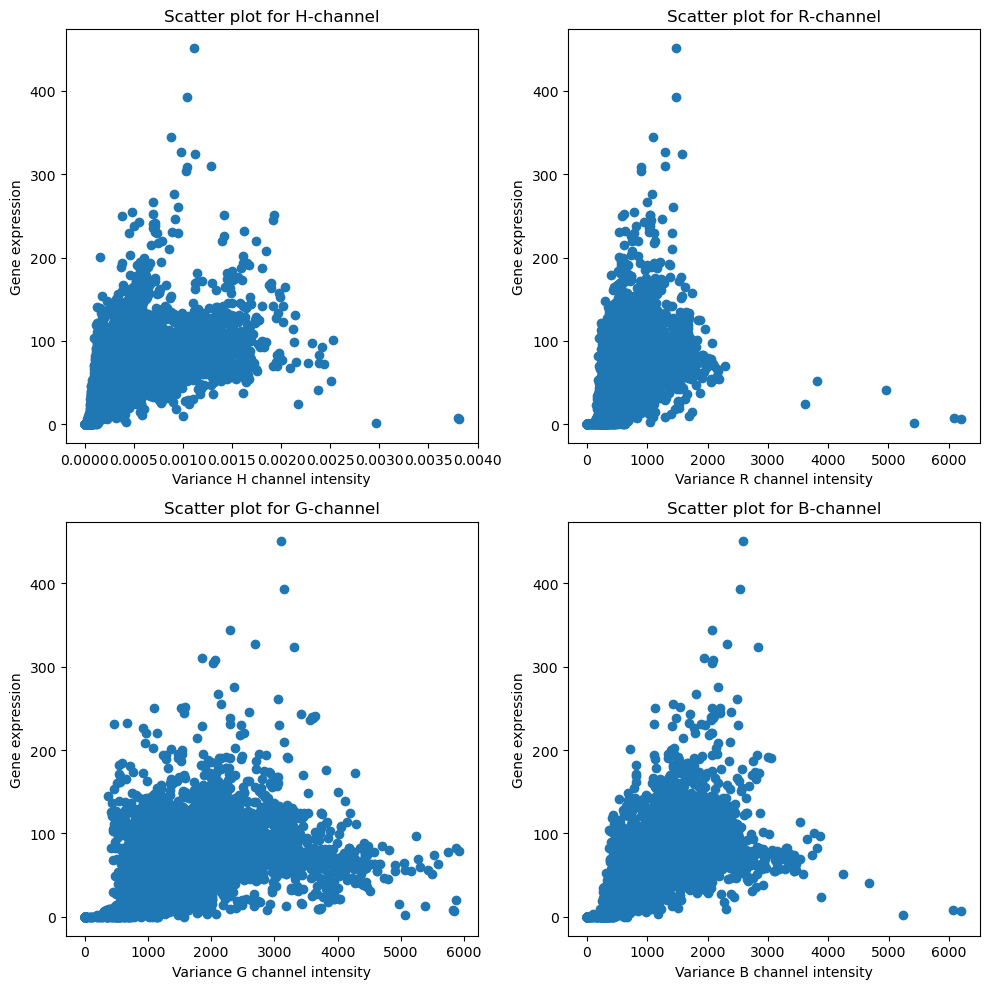

In [132]:
#subplots with 2 rows and 2 columns
fig, axs = plt.subplots(2, 2, figsize=(10, 10))

#plot scatter for H-channel 
axs[0, 0].scatter(var_H12, Y12)
axs[0, 0].set_title("Scatter plot for H-channel")
axs[0, 0].set_xlabel('Variance H channel intensity')
axs[0, 0].set_ylabel('Gene expression')

#plot scatter for R-channel 
axs[0, 1].scatter(var_R12, Y12)
axs[0, 1].set_title("Scatter plot for R-channel")
axs[0, 1].set_xlabel('Variance R channel intensity')
axs[0, 1].set_ylabel('Gene expression')

#plot scatter for G-channel 
axs[1, 0].scatter(var_G12, Y12)
axs[1, 0].set_title("Scatter plot for G-channel")
axs[1, 0].set_xlabel('Variance G channel intensity')
axs[1, 0].set_ylabel('Gene expression')

#plot scatter for B-channel 
axs[1, 1].scatter(var_B12, Y12)
axs[1, 1].set_title("Scatter plot for B-channel")
axs[1, 1].set_xlabel('Variance B channel intensity')
axs[1, 1].set_ylabel('Gene expression')

plt.tight_layout()
plt.show()


### (c) Any other features that you think can be useful for this work. Describe your reasoning for using these features. HINT/Suggestion: You may want to use PCA Coefficients of image data (you may want to use randomized PCA or incremental PCA, see: https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.PCA.html). In case of computational complexity, you can reduce the number of images being used in determining the PCA basis. You can also look at other features such as GLCM features (https://scikit-image.org/docs/dev/auto_examples/features_detection/plot_glcm.html) or transfer learning features. You can resize the images if needed. 

In [133]:
#indices of all images in X corresponding to fold 1 or 2 
fold_1_2_indices = np.where(np.logical_or(F == 1, F == 2))[0]
X12 = X[fold_1_2_indices]

#flatten the images
X12_flat = []

#loop through each image 
for idx in range(len(X12)):
    
    #flatten the images and add them to the list
    X12_flatten = X12[idx].reshape(-1)
    X12_flat.append(X12_flatten)

#PCA with component= 1 and randomized solver
pca = PCA(n_components=1, svd_solver='randomized')

#fit PCA to the flattened images
pca.fit(X12_flat)

#using the PCA model transform the flattened images 
pr = pca.transform(X12_flat)

In [138]:
#correlation coefficient of the variance intensity of B channel and Y folds 1 and 2
corr_var_pr = np.corrcoef(np.concatenate((pr, Y12.reshape(-1, 1)), axis=1), rowvar=False)[0, 1]
print(f"Correlation between PCA and Y12: {corr_var_pr}")

Correlation between PCA and Y12: 0.5383689376418223


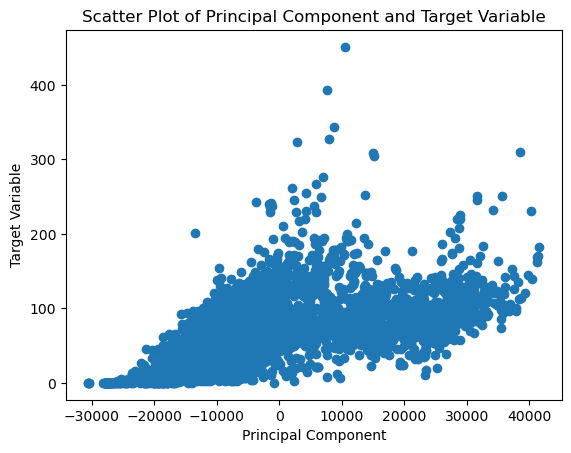

In [139]:
#plot scatter for PCA
plt.scatter(pr, Y12)
plt.xlabel('Principal Component')
plt.ylabel('Target Variable')
plt.title('Scatter Plot of Principal Component and Target Variable')
plt.show()

### Plot the scatter plot and calculate the correlation coefficient of each feature in Q(2i,a-c) you obtain  vs. the target variable (cell count) across all images. Which features do you think are important? Give your reasoning. [20 marks]


In [140]:
#table with all the correlation coeficients 
corr_table = [["Features", "Correlation"],
              ["Avg H12", corr_avg_H12],
              ["Avg R12", corr_avg_R12],
              ["Avg G12", corr_avg_G12],
              ["Avg B12", corr_avg_B12],
              ["Var H12", corr_var_H12],
              ["Var R12", corr_var_R12],
              ["Var G12", corr_var_G12],
              ["Var B12", corr_var_B12],
              ["PCA",corr_var_pr]]

print(tabulate(corr_table, headers='firstrow',tablefmt="grid"))

+------------+---------------+
| Features   |   Correlation |
+============+===============+
| Avg H12    |      0.455272 |
+------------+---------------+
| Avg R12    |     -0.464944 |
+------------+---------------+
| Avg G12    |     -0.563357 |
+------------+---------------+
| Avg B12    |     -0.49733  |
+------------+---------------+
| Var H12    |      0.432974 |
+------------+---------------+
| Var R12    |      0.314518 |
+------------+---------------+
| Var G12    |      0.298147 |
+------------+---------------+
| Var B12    |      0.488162 |
+------------+---------------+
| PCA        |      0.538369 |
+------------+---------------+


### Ans. From the correlation table and the scatter plots, we observe that the target variable and the average values of H12 and R12 have, respectively, a moderately positive and negative connection. The target variable and the average values of G12 and B12 are strongly and somewhat negatively correlated, respectively. The target variable and the variance values of H12 and B12 are somewhat positively correlated with one another. The target variable and the variance values of R12 and G12 are both weakly positively correlated.

### (ii) Try the following regression models with the features used in part-I. Plot the scatter plot between true and predicted counts for each type of regression model for the test data. Also, report your prediction performance in terms of RMSE, Pearson Correlation Coefficient, Spearman Correlation Coefficient and R2 score (https://scikit-learn.org/stable/modules/classes.html#module-sklearn.metrics) on the test data.

### (a) Ordinary Least Squares (OLS) regression


In [5]:
Y3=[]

#indices in Y corresponding to fold 3
for idx, f in enumerate(F):
    if f==3:
        Y3.append(Y.iloc[idx, 6])

In [6]:
#list for average intensity of H channel corresponding to fold 3
avg_H3 = []

#loop through arrays of fold indices and images
for idx, f in enumerate(F):
    if f==3:
        
        #convert the image to the HED color space
        I_hed =  rgb2hed(X[idx])
        
        #extract the H channel
        I_h = I_hed[:,:,0]
        
        #variance intensity value of the H channel
        avg3 = np.mean(I_h)
        
        #append the values to the list
        avg_H3.append(avg3)
    

In [7]:
#function to compute the average intensity of a channel in an RGB image
def average_channel_intensity(image, channel):
    
    #dictionary to map channel names to indices
    channel_dict = {"R": 2, "G": 1, "B": 0}
    
    #index of the specified channel
    channel_idx = channel_dict[channel]
    
    #extract the intensities of the specified channel from the image
    channel_intensities = np.array([row[:, channel_idx] for row in image]).flatten()
    
    #return the variance intensity of the specified channel
    return np.mean(channel_intensities)

In [145]:
#list for average intensity of R channel corresponding to fold 3
avg_R3=[]

#loop through arrays of fold indices and images
for idx, f in enumerate(F):
    if f == 3:
        
        #average intensity value of the R channel
        avg_r3 = average_channel_intensity(X[idx], "R")
        
        #append the values to the list
        avg_R3.append(avg_r3)
        
      

In [146]:
#list for average intensity of G channel corresponding to fold 3
avg_G3=[]

#loop through arrays of fold indices and images
for idx, f in enumerate(F):
    if f == 3:
        
        #average intensity value of the G channel
        avg_g3 = average_channel_intensity(X[idx], "G")
        
        #append the values to the list
        avg_G3.append(avg_g3)

In [147]:
#list for average intensity of B channel corresponding to fold 3
avg_B3=[]

#loop through arrays of fold indices and images
for idx, f in enumerate(F):
    if f == 3:
        
        #average intensity value of the B channel
        avg_b3 = average_channel_intensity(X[idx], "B")
        
        #append the values to the list
        avg_B3.append(avg_b3)

In [148]:
#list for variance intensity of B channel corresponding to fold 3
var_H3 = []

#loop through arrays of fold indices and images
for idx, f in enumerate(F):
    if f == 3:
        
        #convert the image to the HED color space
        I_hed =  rgb2hed(X[idx])
        
        #extract the H channel
        I_h = I_hed[:,:,0]
        
        #variance intensity value of the H channel
        var3 = np.var(I_h)
        
        #append the values to the list
        var_H3.append(var3)

In [149]:
#function to compute the variance intensity of a channel in an RGB image
def variance_channel_intensity(image, channel):
    
    #dictionary to map channel names to indices
    channel_dict = {"R": 2, "G": 1, "B": 0}
    
    #index of the specified channel
    channel_idx = channel_dict[channel]
    
    #extract the intensities of the specified channel from the image
    channel_intensities = np.array([row[:, channel_idx] for row in image]).flatten()
    
    #return the variance intensity of the specified channel
    return np.var(channel_intensities)

In [150]:
#list for variance intensity of B channel corresponding to fold 3
var_R3=[]

#loop through arrays of fold indices and images
for idx, f in enumerate(F):
    if f == 3:
        
        #variance intensity value of the R channel
        var_r3 = variance_channel_intensity(X[idx], "R")
        
        #append the values to the list
        var_R3.append(var_r3)

In [151]:
#list for variance intensity of B channel corresponding to fold 3
var_G3=[]

#loop through arrays of fold indices and images
for idx, f in enumerate(F):
    if f == 3:
        
        #variance intensity value of the G channel
        var_g3 = variance_channel_intensity(X[idx], "G")
        
        #append the values to the list
        var_G3.append(var_g3)

In [152]:
#list for variance intensity of B channel corresponding to fold 3
var_B3=[]

#loop through arrays of fold indices and images
for idx, f in enumerate(F):
    if f == 3:
        
        #variance intensity value of the B channel
        var_b3 = variance_channel_intensity(X[idx], "B")
        
        #append the values to the list
        var_B3.append(var_b3)

In [153]:
#indices of all images in X corresponding to fold 3
fold_3_indices = np.where(F == 3)[0]
X3 = X[fold_3_indices]

#flatten the images
X3_flat = []

#loop through each image 
for idx in range(len(X3)):
    
    # flatten the images and add them to the list
    X3_flatten = X3[idx].reshape(-1)
    X3_flat.append(X3_flatten)

#PCA with component= 1 and randomized solver
pca3 = PCA(n_components=1, svd_solver='randomized')

#fit PCA to the flattened images
pca3.fit(X3_flat)

#using the PCA model transform the flattened images 
pr3 = pca3.transform(X3_flat)


In [154]:
#create a dataframe with all the averages and variances corresponding to fold 1 and 2
df = pd.DataFrame({'Avg H':avg_H12,'Avg R':avg_R12,'Avg G':avg_G12,'Avg B':avg_B12,
                   'Var H':var_H12,'Var R':var_R12,'Var G':var_G12,'Var B':var_B12,
                   'PCA':list(pr)})

In [155]:
#create a dataframe with all the averages and variances corresponding to fold 3
df3 = pd.DataFrame({'Avg H':avg_H3,'Avg R':avg_R3,'Avg G':avg_G3,'Avg B':avg_B3,
                   'Var H':var_H3,'Var R':var_R3,'Var G':var_G3,'Var B':var_B3,
                   'PCA':list(pr3)})

Weights: [ 4.91339519e+03  3.22548621e+00  2.57387725e-01  4.17690104e+00
 -1.05875282e+05 -1.88097296e-02 -1.53464524e-02  9.47390320e-02
  1.07856517e-02]
RMSE= 35.09513877244681
Pearson Correlation Coefficient = PearsonRResult(statistic=0.6493521677263399, pvalue=3.313954901184422e-193)
Spearman Correlation Coefficien = SignificanceResult(statistic=0.6888354563057001, pvalue=1.2141493160614436e-226)
R2 Score = 0.36879972261541916


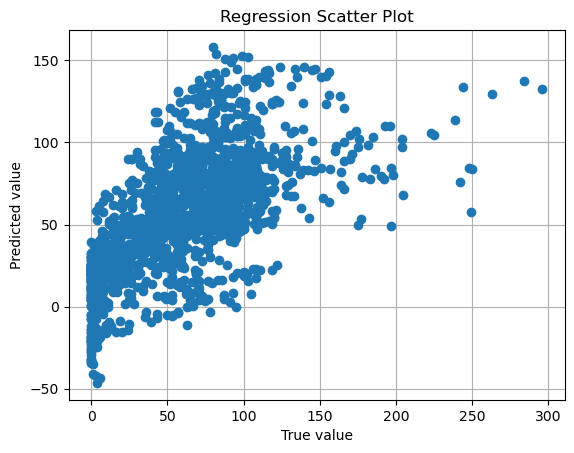

In [156]:
#fit a linear regression model and make predictions on the test set
regr = LinearRegression().fit(df, Y12)
f_r = regr.predict(df3)
print('Weights:',regr.coef_)

#scatter plot of true vs. predicted values
plt.figure()
plt.plot(Y3,f_r,'o')
plt.grid()
plt.xlabel('True value')
plt.ylabel('Predicted value')
plt.title('Regression Scatter Plot')

#root mean squared error (RMSE)
MSE_r = mean_squared_error(Y3, f_r)
RMSE_r = math.sqrt(MSE_r)
print("RMSE=",RMSE_r)

#Pearson correlation coefficient
pearsonr_r=stats.pearsonr(Y3, f_r)
print("Pearson Correlation Coefficient =",pearsonr_r)

#Spearman correlation coefficient
spearmanr_r=stats.spearmanr(Y3, f_r)
print("Spearman Correlation Coefficien =",spearmanr_r)

#R-squared score
r2_score_r=r2_score(Y3, f_r)
print("R2 Score =",r2_score_r)

In [157]:
table_ols = [["Metrics (OLS)", "Value"],
         ["Mean Squared Error",MSE_r],
         ["Root Mean Squared Error", RMSE_r],
         ["Pearson Correlation Coefficient", pearsonr_r[0]],
         ["Pearson Correlation P-value", pearsonr_r[1]],
         ["Spearman Correlation Coefficient", spearmanr_r[0]],
         ["Spearman Correlation P-value", spearmanr_r[1]],
         ["R2 Score", r2_score_r]]

print(tabulate(table_ols, headers='firstrow', tablefmt="grid"))

+----------------------------------+-----------------+
| Metrics (OLS)                    |           Value |
+==================================+=================+
| Mean Squared Error               | 1231.67         |
+----------------------------------+-----------------+
| Root Mean Squared Error          |   35.0951       |
+----------------------------------+-----------------+
| Pearson Correlation Coefficient  |    0.649352     |
+----------------------------------+-----------------+
| Pearson Correlation P-value      |    3.31395e-193 |
+----------------------------------+-----------------+
| Spearman Correlation Coefficient |    0.688835     |
+----------------------------------+-----------------+
| Spearman Correlation P-value     |    1.21415e-226 |
+----------------------------------+-----------------+
| R2 Score                         |    0.3688       |
+----------------------------------+-----------------+


### (b) Support Vector Regression OR Multilayer Perceptron (MLP) OR Both


RMSE= 36.16542740819579
Pearson Correlation Coefficient = PearsonRResult(statistic=0.5950801175206137, pvalue=1.1903395270443321e-154)
Spearman Correlation Coefficien = SignificanceResult(statistic=0.6388281966320698, pvalue=4.053019723089068e-185)
R2 Score = 0.32971352389381714


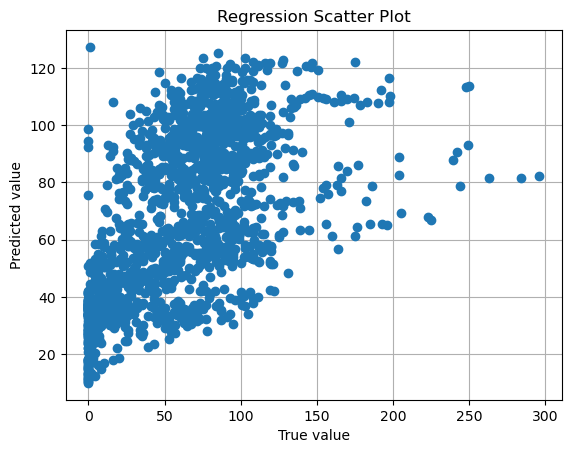

In [159]:
#fit a support vector regression model with a kernel= 1
reg1 = SVR(kernel="poly", C=10.0, degree=1).fit(df, Y12)
f_svr = reg1.predict(df3)

#scatter plot of true vs. predicted values
plt.figure()
plt.plot(Y3,f_svr,'o')
plt.grid()
plt.xlabel('True value')
plt.ylabel('Predicted value')
plt.title('Regression Scatter Plot')

#root mean squared error (RMSE)
MSE_svr = mean_squared_error(Y3, f_svr)
RMSE_svr = math.sqrt(MSE_svr)
print("RMSE=",RMSE_svr)

#Pearson correlation coefficient
pearsonr_svr=stats.pearsonr(Y3, f_svr)
print("Pearson Correlation Coefficient =",pearsonr_svr)

#Spearman correlation coefficient
spearmanr_svr=stats.spearmanr(Y3, f_svr)
print("Spearman Correlation Coefficien =",spearmanr_svr)

#R-squared score
r2_score_svr=r2_score(Y3, f_svr)
print("R2 Score =",r2_score_svr)

In [160]:
table_svr = [["Metrics (SVR)", "Value"],
         ["Mean Squared Error", MSE_svr],
         ["Root Mean Squared Error", RMSE_svr],
         ["Pearson Correlation Coefficient", pearsonr_svr[0]],
         ["Pearson Correlation P-value", pearsonr_svr[1]],
         ["Spearman Correlation Coefficient", spearmanr_svr[0]],
         ["Spearman Correlation P-value", spearmanr_svr[1]],
         ["R2 Score", r2_score_svr]]


print(tabulate(table_svr, headers='firstrow', tablefmt="grid"))

+----------------------------------+-----------------+
| Metrics (SVR)                    |           Value |
+==================================+=================+
| Mean Squared Error               | 1307.94         |
+----------------------------------+-----------------+
| Root Mean Squared Error          |   36.1654       |
+----------------------------------+-----------------+
| Pearson Correlation Coefficient  |    0.59508      |
+----------------------------------+-----------------+
| Pearson Correlation P-value      |    1.19034e-154 |
+----------------------------------+-----------------+
| Spearman Correlation Coefficient |    0.638828     |
+----------------------------------+-----------------+
| Spearman Correlation P-value     |    4.05302e-185 |
+----------------------------------+-----------------+
| R2 Score                         |    0.329714     |
+----------------------------------+-----------------+


### Multilayer Perceptron (MLP)

RMSE= 37.25407976879309
Pearson Correlation Coefficient = PearsonRResult(statistic=0.6616052891499822, pvalue=4.8871380508354454e-203)
Spearman Correlation Coefficien = SignificanceResult(statistic=0.6666060276226948, pvalue=3.481119970011427e-207)
R2 Score = 0.2887522045481493


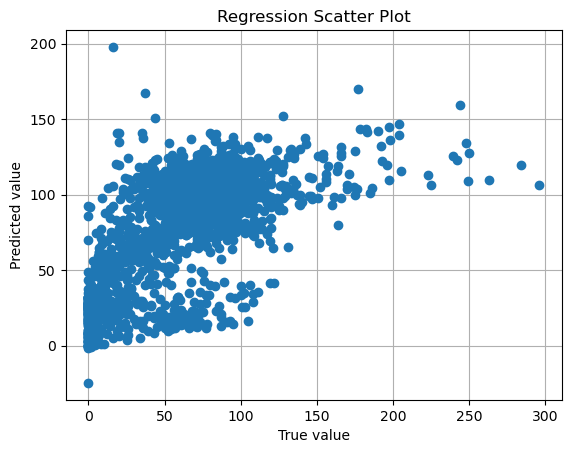

In [161]:
#fit a MLPRegressor model with a random state=1 
regr = MLPRegressor(random_state=1, max_iter=500).fit(df, Y12)
f_p = regr.predict(df3)

#scatter plot of true vs. predicted values
plt.figure()
plt.plot(Y3,f_p,'o')
plt.grid()
plt.xlabel('True value')
plt.ylabel('Predicted value')
plt.title('Regression Scatter Plot')

#root mean squared error (RMSE)
MSE_p = mean_squared_error(Y3, f_p)
RMSE_p = math.sqrt(MSE_p)
print("RMSE=",RMSE_p)

#Pearson correlation coefficient
pearsonr_p=stats.pearsonr(Y3, f_p)
print("Pearson Correlation Coefficient =",pearsonr_p)

#Spearman correlation coefficient
spearmanr_p=stats.spearmanr(Y3, f_p)
print("Spearman Correlation Coefficien =",spearmanr_p)

#R-squared score
r2_score_p=r2_score(Y3, f_p)
print("R2 Score =",r2_score_p)

In [162]:
table_mlp = [["Metric (MLP)", "Value"],  
         ["Mean Squared Error",MSE_p],
         ["Root Mean Squared Error", RMSE_p],
         ["Pearson Correlation Coefficient", pearsonr_p[0]],
         ["Pearson Correlation P-value", pearsonr_p[1]],
         ["Spearman Correlation Coefficient", spearmanr_p[0]],
         ["Spearman Correlation P-value", spearmanr_p[1]],
         ["R2 Score", r2_score_p]]


print(tabulate(table_mlp, headers='firstrow', tablefmt="grid"))

+----------------------------------+-----------------+
| Metric (MLP)                     |           Value |
+==================================+=================+
| Mean Squared Error               | 1387.87         |
+----------------------------------+-----------------+
| Root Mean Squared Error          |   37.2541       |
+----------------------------------+-----------------+
| Pearson Correlation Coefficient  |    0.661605     |
+----------------------------------+-----------------+
| Pearson Correlation P-value      |    4.88714e-203 |
+----------------------------------+-----------------+
| Spearman Correlation Coefficient |    0.666606     |
+----------------------------------+-----------------+
| Spearman Correlation P-value     |    3.48112e-207 |
+----------------------------------+-----------------+
| R2 Score                         |    0.288752     |
+----------------------------------+-----------------+


In [163]:
#consolidated table

table_c= [["Model","Metric", "Value"],
          ["OLS","Mean Squared Error",MSE_r],
          ["OLS","Root Mean Squared Error", RMSE_r],
          ["OLS","Pearson Correlation Coefficient", pearsonr_r[0]],
          ["OLS","Pearson Correlation P-value", pearsonr_r[1]],
          ["OLS","Spearman Correlation Coefficient", spearmanr_r[0]],
          ["OLS","Spearman Correlation P-value", spearmanr_r[1]],
          ["OLS","R2 Score", r2_score_r],
          ["SVR","Mean Squared Error", MSE_svr],
          ["SVR","Root Mean Squared Error", RMSE_svr],
          ["SVR","Pearson Correlation Coefficient", pearsonr_svr[0]],
          ["SVR","Pearson Correlation P-value", pearsonr_svr[1]],
          ["SVR","Spearman Correlation Coefficient", spearmanr_svr[0]],
          ["SVR","Spearman Correlation P-value", spearmanr_svr[1]],
          ["SVR","R2 Score", r2_score_svr],
          ["MLP","Mean Squared Error",MSE_p],
          ["MLP","Root Mean Squared Error", RMSE_p],
          ["MLP","Pearson Correlation Coefficient", pearsonr_p[0]],
          ["MLP","Pearson Correlation P-value", pearsonr_p[1]],
          ["MLP","Spearman Correlation Coefficient", spearmanr_p[0]],
          ["MLP","Spearman Correlation P-value", spearmanr_p[1]],
          ["MLP","R2 Score", r2_score_p]]



print(tabulate(table_c, headers='firstrow', tablefmt="grid"))

+---------+----------------------------------+-----------------+
| Model   | Metric                           |           Value |
+=========+==================================+=================+
| OLS     | Mean Squared Error               | 1231.67         |
+---------+----------------------------------+-----------------+
| OLS     | Root Mean Squared Error          |   35.0951       |
+---------+----------------------------------+-----------------+
| OLS     | Pearson Correlation Coefficient  |    0.649352     |
+---------+----------------------------------+-----------------+
| OLS     | Pearson Correlation P-value      |    3.31395e-193 |
+---------+----------------------------------+-----------------+
| OLS     | Spearman Correlation Coefficient |    0.688835     |
+---------+----------------------------------+-----------------+
| OLS     | Spearman Correlation P-value     |    1.21415e-226 |
+---------+----------------------------------+-----------------+
| OLS     | R2 Score     

### The Mean Squared Error and Root Mean Squared Error are both lowest for the OLS model. Also, it has the highest R2 Score, which shows that it accounts for the most variance in the data. The strongest linear connection with the true values is shown by the MLP model, which also has the highest Pearson and Spearman correlation coefficients. The MLP model could be preferred to accurately depict the relationship between the predictor and responder variables.

### Question 3

### (a) Use a convolutional neural network (in PyTorch) to solve this problem in much the same was as in part (ii) of Question (2). You are to develop an architecture of the neural network that takes an image directly as input and produces a count as the output corresponding to the total number of cells. You are free to choose any network structure as long as you can show that it gives good performance. Report your results on the test examples by plotting the scatter plot between true and predicted counts on the test data. Also, report your results in terms of RMSE, Pearson Correlation Coefficient, Spearman Correlation Coefficient and R2 score. 

###  Report your results on the test examples by plotting the scatter plot between true and predicted counts on the test data. 

### Also, report your results in terms of RMSE, Pearson Correlation Coefficient, Spearman Correlation Coefficient and R2 score.

In [8]:
#Y corresponding to fold 3 

#indices of all rows in F=3
fold_3_indices = np.where(F == 3)[0]

#extracting the 6th column of Y for rows F == 3, converting it to an array and reshaping it to a 1D array
Y3 = Y.iloc[fold_3_indices, 6].to_numpy().reshape(-1)


In [9]:
#Y corresponding to folds 1 and 2

#selecting indices of Y where fold is 1 and 2
fold_1_2_indices = np.where((F == 1) | (F == 2))[0]

#selecting the last column with the total cells corresponding to fold 1 and 2
Y12 = Y.iloc[fold_1_2_indices,6].to_numpy()

In [10]:
#transposing X to have the channel dimension in the 2nd position
X_transposed = np.transpose(X, (0 , 3, 2 , 1))


In [11]:
#X corresponding to fold 3 

#indices of all images in fold 3
test_i = [i for i,x in enumerate(F) if x == 3]

#selecting images in fold 3 from the transposed data X
Xnew = X_transposed[test_i]

In [12]:
#X corresponding to folds 1 and 2

#indices of all folds where F is not equal to 3
train12_i = [i for i,x in enumerate(F) if x != 3]

#selecting those folds for training data
train12 = X_transposed[train12_i]

In [13]:
#definning a custom neural network class
class NET(nn.Module):
    def __init__(self):
        super(NET, self).__init__()
        
        #defining the convolutional layers
        
        #3 input image channels, 6 output channels, 3x3 square convolution kernel
        self.conv1 = nn.Conv2d(3, 6, 3)
        
        #batch normalization after first convolutional layer
        self.bn1 = nn.BatchNorm2d(6)
        
        #6 input image channels, 12 output channels, 3x3 square convolution kernel
        self.conv2 = nn.Conv2d(6, 12, 3)
        
        #batch normalization after second convolutional layer
        self.bn2 = nn.BatchNorm2d(12)
        
        #defining the fully connected layers
        
        #an affine operation: y = Wx + b
        self.fc1 = nn.Linear(4800, 150)
        self.fc2 = nn.Linear(150, 80)
        self.fc3 = nn.Linear(80, 1)
        
        #dropout layer with 0.7 probability of dropping out a neuron
        self.dropout = nn.Dropout(p=0.7)

    def forward(self, x):
        
        #convert input to float
        x = x.float()
        
        #max pooling over a (4, 4) window after first convolutional layer
        x = fun.max_pool2d(fun.relu(self.bn1(self.conv1(x))), 4)
        
        #max pooling over a (3, 3) window after second convolutional layer
        x = fun.max_pool2d(fun.relu(self.bn2(self.conv2(x))), 3)
        
        #flattenning the output of the convolutional layers
        x = torch.flatten(x, 1)
        
        #passing through first fully connected layer and applying relu
        x = fun.relu(self.fc1(x))
        
        #applying dropout to the output of first fully connected layer
        x = self.dropout(x)
        
        #passing through second fully connected layer and applying relu 
        x = fun.relu(self.fc2(x))
        
        #applying dropout to the output of second fully connected layer
        x = self.dropout(x)
        
        #passing through the third fully connected layer to get the final output
        x = self.fc3(x)
        return x


Epoch 0: 100%|████████████| 17/17 [00:44<00:00,  2.64s/batch, train_mse=1.12e+4]


Train average loss: 7069.970195011396


/Users/khush/opt/anaconda3/envs/datamining/lib/python3.9/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([1608])) that is different to the input size (torch.Size([1608, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Test average loss: 4898.35498046875


Epoch 1: 100%|████████████| 17/17 [00:45<00:00,  2.68s/batch, train_mse=8.86e+3]


Train average loss: 5635.13476475643
Test average loss: 3848.8505859375


Epoch 2: 100%|████████████| 17/17 [00:48<00:00,  2.85s/batch, train_mse=5.63e+3]


Train average loss: 3878.7674888070246
Test average loss: 2759.82421875


Epoch 3: 100%|████████████| 17/17 [00:45<00:00,  2.66s/batch, train_mse=3.98e+3]


Train average loss: 2652.5565407394197
Test average loss: 2343.360107421875


Epoch 4: 100%|████████████| 17/17 [00:44<00:00,  2.59s/batch, train_mse=3.75e+3]


Train average loss: 2473.0888268713634
Test average loss: 2388.376220703125


Epoch 5: 100%|████████████| 17/17 [00:41<00:00,  2.44s/batch, train_mse=3.87e+3]


Train average loss: 2412.1789823657073
Test average loss: 2458.740234375


Epoch 6: 100%|████████████| 17/17 [00:43<00:00,  2.58s/batch, train_mse=3.26e+3]


Train average loss: 2289.2762968333086
Test average loss: 2526.2783203125


Epoch 7: 100%|████████████| 17/17 [00:49<00:00,  2.92s/batch, train_mse=3.33e+3]


Train average loss: 2237.3241104682406
Test average loss: 2595.118408203125


Epoch 8: 100%|████████████| 17/17 [00:43<00:00,  2.55s/batch, train_mse=3.11e+3]


Train average loss: 2219.3146955284847
Test average loss: 2653.56591796875


Epoch 9: 100%|████████████| 17/17 [00:42<00:00,  2.48s/batch, train_mse=3.57e+3]


Train average loss: 2141.02874258241
Test average loss: 2737.162841796875


Epoch 10: 100%|███████████| 17/17 [00:45<00:00,  2.66s/batch, train_mse=3.34e+3]


Train average loss: 2190.993233186217
Test average loss: 2789.4599609375


Epoch 11: 100%|███████████| 17/17 [00:44<00:00,  2.59s/batch, train_mse=3.35e+3]


Train average loss: 1980.2828590264137
Test average loss: 2853.706298828125


Epoch 12: 100%|███████████| 17/17 [00:45<00:00,  2.69s/batch, train_mse=2.92e+3]


Train average loss: 2117.51245160616
Test average loss: 2899.692626953125


Epoch 13: 100%|████████████| 17/17 [00:49<00:00,  2.91s/batch, train_mse=3.2e+3]


Train average loss: 2018.49883980727
Test average loss: 2942.31494140625


Epoch 14: 100%|███████████| 17/17 [00:42<00:00,  2.49s/batch, train_mse=2.78e+3]


Train average loss: 2038.388376126825
Test average loss: 2964.6865234375


Epoch 15: 100%|███████████| 17/17 [00:43<00:00,  2.54s/batch, train_mse=2.96e+3]


Train average loss: 1916.0127651600253
Test average loss: 3007.82861328125


Epoch 16: 100%|███████████| 17/17 [00:43<00:00,  2.57s/batch, train_mse=2.86e+3]


Train average loss: 1891.5218981763499
Test average loss: 3054.148193359375


Epoch 17: 100%|███████████| 17/17 [00:43<00:00,  2.54s/batch, train_mse=3.23e+3]


Train average loss: 1939.4881339549595
Test average loss: 3054.380126953125


Epoch 18: 100%|███████████| 17/17 [00:44<00:00,  2.60s/batch, train_mse=3.19e+3]


Train average loss: 1921.1468376659548
Test average loss: 3090.9423828125


Epoch 19: 100%|███████████| 17/17 [00:43<00:00,  2.59s/batch, train_mse=2.78e+3]


Train average loss: 1864.4101890385275
Test average loss: 3138.978515625


Epoch 20: 100%|███████████| 17/17 [00:42<00:00,  2.52s/batch, train_mse=2.77e+3]


Train average loss: 1956.8213729519114
Test average loss: 3161.719970703125


Epoch 21: 100%|███████████| 17/17 [00:43<00:00,  2.56s/batch, train_mse=2.57e+3]


Train average loss: 1861.7074782017817
Test average loss: 3172.248291015625


Epoch 22: 100%|███████████| 17/17 [00:43<00:00,  2.57s/batch, train_mse=2.74e+3]


Train average loss: 1781.3519079738226
Test average loss: 3197.93212890625


Epoch 23: 100%|███████████| 17/17 [00:42<00:00,  2.50s/batch, train_mse=3.02e+3]


Train average loss: 1784.2432069843471
Test average loss: 3228.146728515625


Epoch 24: 100%|███████████| 17/17 [00:42<00:00,  2.51s/batch, train_mse=2.76e+3]


Train average loss: 1880.7352222179115
Test average loss: 3205.103515625


Epoch 25: 100%|███████████| 17/17 [00:45<00:00,  2.70s/batch, train_mse=2.52e+3]


Train average loss: 1834.160159796662
Test average loss: 3212.205322265625


Epoch 26: 100%|███████████| 17/17 [00:42<00:00,  2.48s/batch, train_mse=2.58e+3]


Train average loss: 1810.0064114237834
Test average loss: 3232.32666015625


Epoch 27: 100%|███████████| 17/17 [00:42<00:00,  2.49s/batch, train_mse=2.84e+3]


Train average loss: 1772.2103649674343
Test average loss: 3260.827392578125


Epoch 28: 100%|███████████| 17/17 [00:42<00:00,  2.52s/batch, train_mse=2.43e+3]


Train average loss: 1810.6648901026997
Test average loss: 3326.039306640625


Epoch 29: 100%|███████████| 17/17 [00:41<00:00,  2.47s/batch, train_mse=2.97e+3]


Train average loss: 1882.9622126335282
Test average loss: 3286.50341796875


Epoch 30: 100%|███████████| 17/17 [00:42<00:00,  2.48s/batch, train_mse=3.01e+3]


Train average loss: 1796.0018970298372
Test average loss: 3266.3564453125


Epoch 31: 100%|███████████| 17/17 [00:42<00:00,  2.50s/batch, train_mse=2.91e+3]


Train average loss: 1759.7633806144381
Test average loss: 3275.75537109375


Epoch 32: 100%|████████████| 17/17 [00:42<00:00,  2.48s/batch, train_mse=2.6e+3]


Train average loss: 1812.201332994784
Test average loss: 3258.262939453125


Epoch 33: 100%|███████████| 17/17 [00:42<00:00,  2.51s/batch, train_mse=2.43e+3]


Train average loss: 1749.5472205462033
Test average loss: 3311.00927734375


Epoch 34: 100%|███████████| 17/17 [00:43<00:00,  2.57s/batch, train_mse=2.94e+3]


Train average loss: 1716.974461790436
Test average loss: 3289.48095703125


Epoch 35: 100%|████████████| 17/17 [00:42<00:00,  2.50s/batch, train_mse=2.7e+3]


Train average loss: 1749.7943942185648
Test average loss: 3259.261962890625


Epoch 36: 100%|███████████| 17/17 [00:41<00:00,  2.47s/batch, train_mse=2.47e+3]


Train average loss: 1694.7888997154564
Test average loss: 3286.752685546875


Epoch 37: 100%|████████████| 17/17 [00:42<00:00,  2.53s/batch, train_mse=2.4e+3]


Train average loss: 1636.9818937118987
Test average loss: 3339.69091796875


Epoch 38: 100%|███████████| 17/17 [00:43<00:00,  2.58s/batch, train_mse=2.42e+3]


Train average loss: 1603.767832760849
Test average loss: 3317.59033203125


Epoch 39: 100%|███████████| 17/17 [00:43<00:00,  2.54s/batch, train_mse=2.81e+3]


Train average loss: 1727.4218089162791
Test average loss: 3270.211181640625


Epoch 40: 100%|███████████| 17/17 [00:43<00:00,  2.57s/batch, train_mse=2.56e+3]


Train average loss: 1642.717881429736
Test average loss: 3284.400634765625


Epoch 41: 100%|███████████| 17/17 [00:42<00:00,  2.50s/batch, train_mse=2.75e+3]


Train average loss: 1709.8123383735501
Test average loss: 3282.902099609375


Epoch 42: 100%|███████████| 17/17 [00:42<00:00,  2.50s/batch, train_mse=2.59e+3]


Train average loss: 1688.2471737447422
Test average loss: 3264.87841796875


Epoch 43: 100%|███████████| 17/17 [00:43<00:00,  2.55s/batch, train_mse=2.39e+3]


Train average loss: 1642.5881484456067
Test average loss: 3256.434326171875


Epoch 44: 100%|███████████| 17/17 [00:43<00:00,  2.56s/batch, train_mse=2.43e+3]


Train average loss: 1674.0220779703945
Test average loss: 3284.199462890625


Epoch 45: 100%|███████████| 17/17 [00:43<00:00,  2.56s/batch, train_mse=2.24e+3]


Train average loss: 1645.8705409050272
Test average loss: 3301.581298828125


Epoch 46: 100%|███████████| 17/17 [00:47<00:00,  2.77s/batch, train_mse=2.42e+3]


Train average loss: 1637.989323389555
Test average loss: 3289.663818359375


Epoch 47: 100%|████████████| 17/17 [00:42<00:00,  2.49s/batch, train_mse=2.5e+3]


Train average loss: 1604.9479031555736
Test average loss: 3311.94921875


Epoch 48: 100%|███████████| 17/17 [00:43<00:00,  2.56s/batch, train_mse=2.48e+3]


Train average loss: 1626.2001489887525
Test average loss: 3332.890625


Epoch 49: 100%|███████████| 17/17 [00:44<00:00,  2.61s/batch, train_mse=2.23e+3]


Train average loss: 1589.093953534965
Test average loss: 3319.95751953125


Epoch 50: 100%|███████████| 17/17 [00:42<00:00,  2.50s/batch, train_mse=2.21e+3]


Train average loss: 1530.0035782923446
Test average loss: 3346.3349609375


Epoch 51: 100%|████████████| 17/17 [00:43<00:00,  2.57s/batch, train_mse=2.3e+3]


Train average loss: 1671.0692957661254
Test average loss: 3338.293701171875


Epoch 52: 100%|███████████| 17/17 [00:43<00:00,  2.56s/batch, train_mse=2.65e+3]


Train average loss: 1616.513157536642
Test average loss: 3326.37109375


Epoch 53: 100%|███████████| 17/17 [00:43<00:00,  2.54s/batch, train_mse=2.29e+3]


Train average loss: 1569.0328516435666
Test average loss: 3300.77294921875


Epoch 54: 100%|███████████| 17/17 [00:42<00:00,  2.52s/batch, train_mse=2.56e+3]


Train average loss: 1617.1794807802771
Test average loss: 3313.837890625


Epoch 55: 100%|████████████| 17/17 [00:43<00:00,  2.55s/batch, train_mse=2.3e+3]


Train average loss: 1585.2239679358602
Test average loss: 3287.89697265625


Epoch 56: 100%|███████████| 17/17 [00:42<00:00,  2.51s/batch, train_mse=2.48e+3]


Train average loss: 1582.1587921604007
Test average loss: 3305.8115234375


Epoch 57: 100%|███████████| 17/17 [00:44<00:00,  2.62s/batch, train_mse=2.29e+3]


Train average loss: 1560.5401475614021
Test average loss: 3335.780029296875


Epoch 58: 100%|███████████| 17/17 [00:42<00:00,  2.51s/batch, train_mse=2.38e+3]


Train average loss: 1591.418088829839
Test average loss: 3353.132080078125


Epoch 59: 100%|███████████| 17/17 [00:42<00:00,  2.48s/batch, train_mse=2.52e+3]


Train average loss: 1643.0013929695606
Test average loss: 3343.177734375


Epoch 60: 100%|███████████| 17/17 [00:42<00:00,  2.47s/batch, train_mse=2.26e+3]


Train average loss: 1544.9677031556894
Test average loss: 3344.53271484375


Epoch 61: 100%|████████████| 17/17 [00:44<00:00,  2.61s/batch, train_mse=2.3e+3]


Train average loss: 1576.903445458999
Test average loss: 3399.2822265625


Epoch 62: 100%|███████████| 17/17 [00:42<00:00,  2.51s/batch, train_mse=2.29e+3]


Train average loss: 1494.6899506709995
Test average loss: 3357.0107421875


Epoch 63: 100%|███████████| 17/17 [00:43<00:00,  2.57s/batch, train_mse=2.51e+3]


Train average loss: 1566.069971296648
Test average loss: 3336.769287109375


Epoch 64: 100%|███████████| 17/17 [00:43<00:00,  2.56s/batch, train_mse=2.47e+3]


Train average loss: 1584.8487758370702
Test average loss: 3326.34814453125


Epoch 65: 100%|████████████| 17/17 [00:42<00:00,  2.52s/batch, train_mse=2.4e+3]


Train average loss: 1488.1207113619414
Test average loss: 3353.21533203125


Epoch 66: 100%|███████████| 17/17 [00:41<00:00,  2.43s/batch, train_mse=2.67e+3]


Train average loss: 1489.4762237575972
Test average loss: 3334.339599609375


Epoch 67: 100%|███████████| 17/17 [00:42<00:00,  2.48s/batch, train_mse=2.28e+3]


Train average loss: 1435.3370745308562
Test average loss: 3369.53076171875


Epoch 68: 100%|███████████| 17/17 [00:42<00:00,  2.52s/batch, train_mse=2.33e+3]


Train average loss: 1521.0928831668766
Test average loss: 3386.783447265625


Epoch 69: 100%|███████████| 17/17 [00:42<00:00,  2.49s/batch, train_mse=2.21e+3]


Train average loss: 1473.0591463054495
Test average loss: 3371.50146484375


Epoch 70: 100%|███████████| 17/17 [00:44<00:00,  2.63s/batch, train_mse=2.19e+3]


Train average loss: 1554.0739434856073
Test average loss: 3346.923095703125


Epoch 71: 100%|███████████| 17/17 [00:42<00:00,  2.48s/batch, train_mse=2.18e+3]


Train average loss: 1486.6331714366615
Test average loss: 3383.796142578125


Epoch 72: 100%|███████████| 17/17 [00:42<00:00,  2.52s/batch, train_mse=2.49e+3]


Train average loss: 1602.2090639939408
Test average loss: 3362.50537109375


Epoch 73: 100%|███████████| 17/17 [00:42<00:00,  2.51s/batch, train_mse=2.46e+3]


Train average loss: 1491.0532408238446
Test average loss: 3408.180908203125


Epoch 74: 100%|███████████| 17/17 [00:42<00:00,  2.49s/batch, train_mse=2.17e+3]


Train average loss: 1460.0799546432609
Test average loss: 3412.98486328125


Epoch 75: 100%|███████████| 17/17 [00:42<00:00,  2.50s/batch, train_mse=2.41e+3]


Train average loss: 1586.0268215945098
Test average loss: 3406.912841796875


Epoch 76: 100%|███████████| 17/17 [00:42<00:00,  2.51s/batch, train_mse=2.56e+3]


Train average loss: 1449.721840300618
Test average loss: 3447.28564453125


Epoch 77: 100%|███████████| 17/17 [00:44<00:00,  2.63s/batch, train_mse=2.24e+3]


Train average loss: 1485.69532603522
Test average loss: 3436.72412109375


Epoch 78: 100%|███████████| 17/17 [00:42<00:00,  2.49s/batch, train_mse=2.36e+3]


Train average loss: 1479.8994483710255
Test average loss: 3401.123291015625


Epoch 79: 100%|████████████| 17/17 [00:43<00:00,  2.57s/batch, train_mse=2.2e+3]


Train average loss: 1504.7196659797241
Test average loss: 3362.18603515625


Epoch 80: 100%|███████████| 17/17 [00:41<00:00,  2.47s/batch, train_mse=2.39e+3]


Train average loss: 1515.86936319613
Test average loss: 3347.896484375


Epoch 81: 100%|███████████| 17/17 [00:43<00:00,  2.56s/batch, train_mse=2.11e+3]


Train average loss: 1418.3673159760183
Test average loss: 3403.08251953125


Epoch 82: 100%|███████████| 17/17 [00:43<00:00,  2.56s/batch, train_mse=2.13e+3]


Train average loss: 1494.3407175316854
Test average loss: 3411.453857421875


Epoch 83: 100%|███████████| 17/17 [00:42<00:00,  2.50s/batch, train_mse=2.38e+3]


Train average loss: 1502.0996418016232
Test average loss: 3410.877197265625


Epoch 84: 100%|███████████| 17/17 [00:40<00:00,  2.39s/batch, train_mse=2.24e+3]


Train average loss: 1451.6629194615327
Test average loss: 3447.925048828125


Epoch 85: 100%|███████████| 17/17 [00:42<00:00,  2.53s/batch, train_mse=2.33e+3]


Train average loss: 1492.1202806958522
Test average loss: 3394.7646484375


Epoch 86: 100%|███████████| 17/17 [00:42<00:00,  2.51s/batch, train_mse=2.35e+3]


Train average loss: 1465.681804278114
Test average loss: 3415.1650390625


Epoch 87: 100%|███████████| 17/17 [00:43<00:00,  2.58s/batch, train_mse=2.47e+3]


Train average loss: 1477.3625069919906
Test average loss: 3425.279296875


Epoch 88: 100%|███████████| 17/17 [00:42<00:00,  2.51s/batch, train_mse=2.13e+3]


Train average loss: 1408.6896463818837
Test average loss: 3430.429931640625


Epoch 89: 100%|███████████| 17/17 [00:42<00:00,  2.48s/batch, train_mse=2.27e+3]


Train average loss: 1516.0514798700156
Test average loss: 3446.33837890625


Epoch 90: 100%|███████████| 17/17 [00:43<00:00,  2.54s/batch, train_mse=2.23e+3]


Train average loss: 1533.5861904710894
Test average loss: 3455.587646484375


Epoch 91: 100%|███████████| 17/17 [00:41<00:00,  2.46s/batch, train_mse=2.19e+3]


Train average loss: 1400.7557885865235
Test average loss: 3504.222900390625


Epoch 92: 100%|████████████| 17/17 [00:44<00:00,  2.60s/batch, train_mse=2.2e+3]


Train average loss: 1492.6721178377695
Test average loss: 3483.631103515625


Epoch 93: 100%|███████████| 17/17 [00:42<00:00,  2.53s/batch, train_mse=2.24e+3]


Train average loss: 1391.3658665493904
Test average loss: 3462.60498046875


Epoch 94: 100%|███████████| 17/17 [00:42<00:00,  2.49s/batch, train_mse=2.05e+3]


Train average loss: 1422.7285770039653
Test average loss: 3448.350341796875


Epoch 95: 100%|███████████| 17/17 [00:42<00:00,  2.53s/batch, train_mse=2.28e+3]


Train average loss: 1420.2958640565937
Test average loss: 3462.198974609375


Epoch 96: 100%|███████████| 17/17 [00:43<00:00,  2.56s/batch, train_mse=2.24e+3]


Train average loss: 1495.2527959276795
Test average loss: 3457.5888671875


Epoch 97: 100%|███████████| 17/17 [00:43<00:00,  2.54s/batch, train_mse=2.02e+3]


Train average loss: 1425.3907143179754
Test average loss: 3465.67578125


Epoch 98: 100%|███████████| 17/17 [00:48<00:00,  2.88s/batch, train_mse=2.24e+3]


Train average loss: 1482.5313258551364
Test average loss: 3461.773681640625


Epoch 99: 100%|███████████| 17/17 [00:43<00:00,  2.55s/batch, train_mse=2.24e+3]


Train average loss: 1417.3685811933692
Test average loss: 3504.961181640625


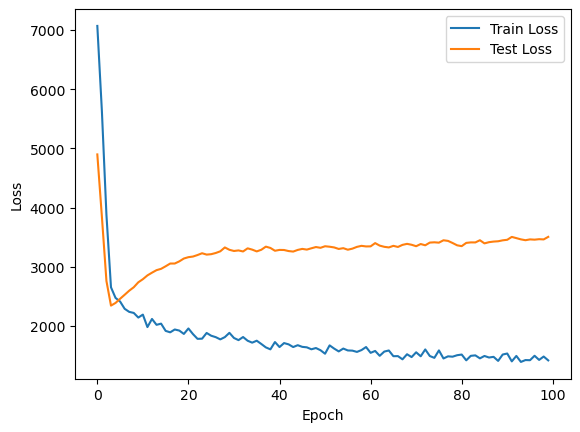

In [17]:
net = NET()

#mean square error
loss_fn = nn.MSELoss()  
optimizer = optim.Adam(net.parameters(), lr=0.0001)

#create the training and test data
Ytrain = torch.tensor(Y12)
Xtrain = torch.tensor(train12)
Ytest = torch.tensor(Y3)
Xtest=torch.tensor(Xnew)

#set the training parameters

#number of epochs to run
n_epochs = 100

#size of each batch
batch_size = 200 
batch_start = torch.arange(0, len(Xtrain), batch_size)

#list to hold the training loss values
train_losses = [] 

#list to hold the test loss values
test_losses = []   
#training loop
for epoch in range(n_epochs):
    
    #initialize total training loss for this epoch
    train_loss = 0.0
    
    #initialize total test loss for this epoch
    test_loss = 0.0 
    net.train()
    with tqdm(batch_start, unit="batch", mininterval=0, disable=False) as bar:
        bar.set_description(f"Epoch {epoch}")
        for start in bar:
            
            #take a batch
            X_batch = Xtrain[start:start+batch_size]
            y_batch = Ytrain[start:start+batch_size].reshape(-1, 1)
            
            #forward pass
            y_pred = net(X_batch)
            loss = loss_fn(y_pred.float(), y_batch.float())
            train_loss += loss.item() * X_batch.size(0)
            
            #backward pass
            optimizer.zero_grad()
            loss.backward()
            
            #update weights
            optimizer.step()
            
            #print progress
            bar.set_postfix(train_mse=float(loss))
         
        #calculate average training loss for this epoch
        train_loss /= len(Xtrain)  
        train_losses.append(train_loss)
        print(f"Train average loss: {train_loss}")
        
    net.eval()
    with torch.no_grad():
        
        #forward pass on test data
        y_test_pred = net(Xtest)
        
        #calculate test loss
        testloss = loss_fn(y_test_pred.float(), Ytest.float())
        test_loss += testloss.item()*Xtest.size(0)
    test_loss /= len(Xtest)
    test_losses.append(test_loss)
    print(f"Test average loss: {test_loss}")
        

#plot the loss values
plt.plot(train_losses, label='Train Loss')
plt.plot(test_losses, label='Test Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()


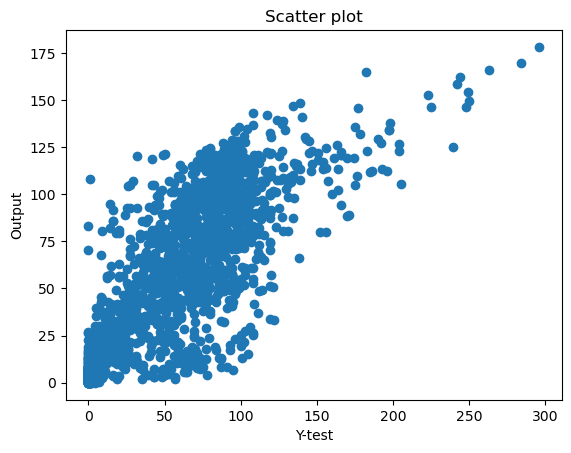

In [18]:
#scatter plot
plt.scatter(Ytest, y_test_pred)

#slabels and title
plt.xlabel('Y-test')
plt.ylabel('Output')
plt.title('Scatter plot')

plt.show()


In [19]:
#mean squared error between the predicted and actual test 
MSE_a = mean_squared_error(Ytest, y_test_pred)

#root mean squared error by taking the square root of the MSE
RMSE_a = math.sqrt(MSE_a)
print("RMSE=",RMSE_a)

#Pearson correlation coefficient between predicted and actual test 
pearsonr_a=stats.pearsonr(Ytest, y_test_pred)
print("Pearson Correlation Coefficient =",pearsonr_a)

#Spearman correlation coefficient between predicted and actual test 
spearmanr_a=stats.spearmanr(Ytest, y_test_pred)
print("Spearman Correlation Coefficien =",spearmanr_a)

#R^2 score between predicted and actual test 
r2_score_a=r2_score(Ytest, y_test_pred)
print("R2 Score =",r2_score_a)

RMSE= 29.07084202040669
Pearson Correlation Coefficient = PearsonRResult(statistic=array([0.7640454046562261], dtype=object), pvalue=5.549604508625697e-308)
Spearman Correlation Coefficien = SignificanceResult(statistic=0.7665838643633098, pvalue=2.965878695124e-311)
R2 Score = 0.5668997094450503


In [20]:
table = [["Metric", "Value"],
         ["Mean Squared Error",MSE_a],
         ["Root Mean Squared Error", RMSE_a],
         ["Pearson Correlation Coefficient", pearsonr_a[0]],
         ["Pearson Correlation P-value", pearsonr_a[1]],
         ["Spearman Correlation Coefficient", spearmanr_a[0]],
         ["Spearman Correlation P-value", spearmanr_a[1]],
         ["R2 Score", r2_score_a]]


print(tabulate(table, headers='firstrow', tablefmt="grid"))

+----------------------------------+----------------+
| Metric                           |          Value |
+==================================+================+
| Mean Squared Error               | 845.114        |
+----------------------------------+----------------+
| Root Mean Squared Error          |  29.0708       |
+----------------------------------+----------------+
| Pearson Correlation Coefficient  |   0.764045     |
+----------------------------------+----------------+
| Pearson Correlation P-value      |   5.5496e-308  |
+----------------------------------+----------------+
| Spearman Correlation Coefficient |   0.766584     |
+----------------------------------+----------------+
| Spearman Correlation P-value     |   2.96588e-311 |
+----------------------------------+----------------+
| R2 Score                         |   0.5669       |
+----------------------------------+----------------+


### With a low RMSE and a high correlation coefficient, it seems that the model is performing reasonably well based on these parameters. The R2 rating, however, shows that the model could not be fully accounting for the target variable's variance.

### Question 3b

### Use a convolutional neural network (in Pytorch) to predict the counts of 6 types of cells simultaneously given the image patch as input as well as the total number of cells (7 outputs in total). You are free to choose any network structure as long as you can show that it gives good cross-validation performance. Report the results for the test fold for each cell type in the form of separate predicted-vs-actual count scatter plots (3 folds, 6 cell types and 1 as the total number of cells so 21 plots in total) using your optimal machine learning model and report your results in terms of RMSE, Pearson Correlation Coefficient, Spearman Correlation Coefficient and R2 score for each cell type and the total number of cells.

In [5]:
#Y corresponding to folds 1 and 2 

#indices of all rows in folds 1 and 2
fold_12_indices = np.where((F == 1) | (F == 2))[0]

#extracting Y for rows F =1 and 2
Y12b = Y.iloc[fold_12_indices].to_numpy()

In [6]:
#Y corresponding to fold 3

#indices of all rows in fold 3
fold_3b_indices = np.where(F == 3)[0]

#extracting Y for rows F =3
Y3b = Y.iloc[fold_3b_indices].to_numpy()

In [7]:
#transposing X to have the channel dimension in the 2nd position
X_transposed_b = np.transpose(X, (0 , 3, 2 , 1))

In [8]:
#X corresponding to fold 3

#X corresponding to fold 3 
X_transposed_b = np.transpose(X, (0 , 3, 2 , 1))

#indices of all images in fold 3
test_i_b = [i for i,x in enumerate(F) if x == 3]

#selecting images in fold 3 from the transposed data X
X3b = X_transposed_b[test_i_b]

In [9]:
#X corresponding to folds 1 and 2 

#indices of all folds where F is not equal to 3
train12b_i= [i for i,x in enumerate(F) if x != 3]

#selecting those folds
train12b = X_transposed_b[train12b_i]

In [10]:
import torch
import torch.nn as nn
import torch.nn.functional as F

#definning a custom neural network class
class NET(nn.Module):
    def __init__(self):
        super(NET, self).__init__()
        
        #definning the layers of the network
    
        #convolutional layer with 3 input channels, 12 output channels, and a kernel size of 5x5
        self.conv1 = nn.Conv2d(3,12,5)
        
        #batch normalization layer for the output of first convolutional layer
        self.bn1 = nn.BatchNorm2d(12)
        
        #convolutional layer with 12 input channels, 24 output channels, and a kernel size of 5x5
        self.conv2 = nn.Conv2d(12,24,5)
        
        #batch normalization layer for the output of second convolutional layer
        self.bn2 = nn.BatchNorm2d(24)
        
        #convolutional layer with 24 input channels, 48 output channels, and a kernel size of 5x5
        self.conv3 = nn.Conv2d(24,48,5)
        
        #batch normalization layer for the output of third convolutional layer
        self.bn3 = nn.BatchNorm2d(48)
        
        #max pooling layer with a kernel size of 2x2 and a stride of 2
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)
        
        #fully connected layers and batch normalization layers
        self.fc1 = nn.Linear(37632,500)
        
        #batch normalization layer for output of fc1
        self.bn4 = nn.BatchNorm1d(500)
        
        #dropout layer with probability of 0.5
        self.dropout1 = nn.Dropout(p=0.5)
        
        #input size of 500, output size of 20
        self.fc2 = nn.Linear(500,20)
        
        #batch normalization layer for output of fc2
        self.bn5 = nn.BatchNorm1d(20)
        
        #dropout layer with probability of 0.5
        self.dropout2 = nn.Dropout(p=0.5)
        
        #input size of 20, output size of 7
        self.fc3 = nn.Linear(20,7)

    def forward(self, x):
        
        #forward pass of the neural network
        
        #convert input to float
        x = x.float()
        
        #convolution, batch normalization, ReLU activation, and max pooling
        x = self.pool(F.relu(self.bn1(self.conv1(x))))
        
        #convolution, batch normalization, ReLU activation, and max pooling
        x = self.pool(F.relu(self.bn2(self.conv2(x))))
        
        #convolution, batch normalization, ReLU activation, and max pooling
        x = self.pool(F.relu(self.bn3(self.conv3(x))))
        
        #flatten the output of convolutional layers
        x = torch.flatten(x, 1)
        
        #fully connected layer, batch normalization, and ReLU activation
        x = F.relu(self.bn4(self.fc1(x)))
        
        #apply dropout
        x = self.dropout1(x)
        
        #fully connected layer, batch normalization, and ReLU activation
        x = F.relu(self.bn5(self.fc2(x)))
        
        #pply dropout
        x = self.dropout2(x)
        
        #afinal fully connected layer
        x = self.fc3(x)
        
        #return the output
        return x

    


In [12]:
net = NET()

#mean square error
loss_fn = nn.MSELoss()
optimizer = optim.Adam(net.parameters(), lr=0.0001)

#create the training and test data
Ytrainb = torch.tensor(Y12b)
Xtrainb = torch.tensor(train12b)
Xtestb = torch.tensor(X3b)
Ytestb = torch.tensor(Y3b)

#set the training parameters

#number of epochs to run
n_epochs =5 #(couldn't run more than this kernel was crashing)

#size of each batch
batch_size = 32
batch_start = torch.arange(0, len(Xtrainb), batch_size)

#list to hold the training loss values
train_losses_b = []

#list to hold the test loss values
test_losses_b = []

#training loop
for epoch in range(n_epochs):
    
    #initialize total training loss for this epoch
    train_lossesb = 0.0
    
    #initialize total test loss for this epoch
    test_lossesb=0.0
    net.train()
    with tqdm(batch_start, unit="batch", mininterval=0, disable=False) as bar:
        bar.set_description(f"Epoch {epoch}")
        for start in bar:
            
            #take a batch
            X_batch_b = Xtrainb[start:start+batch_size]
            y_batch_b = Ytrainb[start:start+batch_size]
            
            #forward pass
            y_pred_b = net(X_batch_b)
            loss_b = loss_fn(y_pred_b.float(), y_batch_b.float())
            train_lossesb += loss_b.item() * X_batch_b.size(0)
            
            #backward pass
            optimizer.zero_grad()
            loss_b.backward()
            
            #update weights
            optimizer.step()
            
            #print progress
            bar.set_postfix(mse=float(loss_b))
            
        #calculate average training loss for this epoch
        train_lossesb /= len(Xtrainb)
        train_losses_b.append(train_lossesb)
        print(f"Train average loss: {train_lossesb}")
        
    net.eval()
    with torch.no_grad():
        
        #forward pass on test data
        y_test_predb = net(Xtestb)
        
        #calculate test loss
        test_lossesb = loss_fn(y_test_predb.float(), Ytestb.float())
        test_lossesb += test_lossesb.item()*Xtestb.size(0)
    test_lossesb /= len(Xtestb)
    test_losses_b.append(test_lossesb)
    print(f"Test average loss: {test_lossesb}")



Epoch 0: 100%|████████████████| 106/106 [05:09<00:00,  2.92s/batch, mse=4.14e+3]


Train average loss: 1884.8122560765175
Test average loss: 1446.6256103515625


Epoch 1: 100%|████████████████| 106/106 [05:00<00:00,  2.84s/batch, mse=4.12e+3]


Train average loss: 1876.8614384334235
Test average loss: 1436.462890625


Epoch 2: 100%|████████████████| 106/106 [05:25<00:00,  3.07s/batch, mse=4.11e+3]


Train average loss: 1870.6909506848965
Test average loss: 1424.5238037109375


Epoch 3: 100%|█████████████████| 106/106 [05:11<00:00,  2.94s/batch, mse=4.1e+3]


Train average loss: 1864.5237309319875
Test average loss: 1418.983154296875


Epoch 4: 100%|████████████████| 106/106 [05:15<00:00,  2.98s/batch, mse=4.11e+3]


Train average loss: 1858.271845555468
Test average loss: 1418.05810546875


In [13]:
#renaming results 
y_trueb = Ytestb
y_predb = y_test_predb

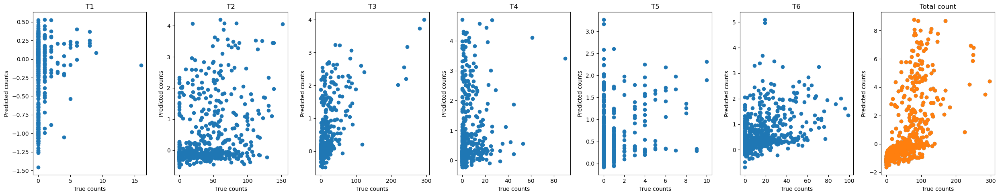

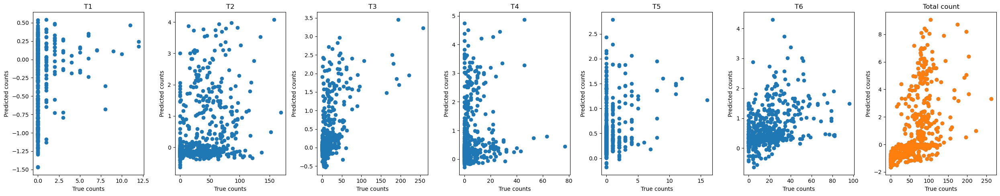

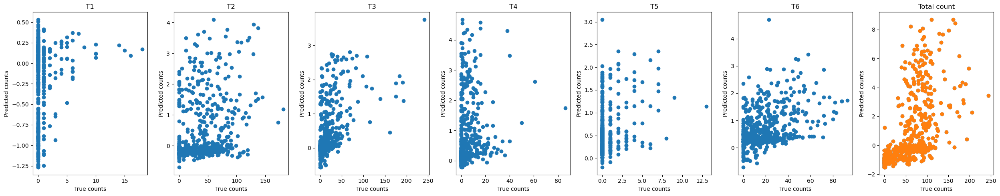

In [15]:
import matplotlib.pyplot as plt

def plot_scatter_plots(y_true, y_pred, cell_types, fold_title, axs):
    for i, cell_type in enumerate(cell_types): 
        
        #true and predicted counts for this cell type
        y_true_i = y_true[:, i]
        y_pred_i = y_pred[:, i]

        #scatter plot for a particular cell type
        axs[i].scatter(y_true_i, y_pred_i)
        axs[i].set_xlabel("True counts")
        axs[i].set_ylabel("Predicted counts")
        axs[i].set_title(cell_type)

    #scatter plot for the total count
    y_true_total = y_true[:, -1]
    y_pred_total = y_pred[:, -1]
    axs[-1].scatter(y_true_total, y_pred_total)
    axs[-1].set_xlabel("True counts")
    axs[-1].set_ylabel("Predicted counts")
    axs[-1].set_title("Total count")

#number of folds
num_folds = 3

#cell types
cell_types = ["T1", "T2", "T3", "T4", "T5", "T6", "T7"]

#loop over the folds
for fold in range(num_folds):
    
    #true and predicted counts for the current fold
    y_true_fold = y_trueb[fold::num_folds]
    y_pred_fold = y_predb[fold::num_folds]

    #figure with 7 subplots
    fig, axs = plt.subplots(1, 7, figsize=(25, 5))

    #scatter plots for the current fold
    plot_scatter_plots(y_true_fold, y_pred_fold, cell_types, f"Fold {fold+1}", axs)

    fig.tight_layout()
    plt.show()


In [20]:
from tabulate import tabulate
from sklearn.metrics import mean_squared_error, r2_score, explained_variance_score
import numpy as np
from scipy.stats import spearmanr

def get_metrics(y_true, y_pred):
    rmse = mean_squared_error(y_true, y_pred, squared=False)
    pearson = np.corrcoef(y_true, y_pred)[0,1]
    spearman = spearmanr(y_true, y_pred)[0]
    r2 = r2_score(y_true, y_pred)
    evs = explained_variance_score(y_true, y_pred)
    return [rmse, pearson, spearman, r2, evs]

#number of folds
num_folds = 3

#cell types
cell_types = ["T1", "T2", "T3", "T4", "T5", "T6", "T7"]

#empty list to store the results
results = []

#loop over the folds
for fold in range(num_folds):
    
    #true and predicted counts for the current fold
    y_true_fold = y_trueb[fold::num_folds]
    y_pred_fold = y_predb[fold::num_folds]

    #loop over the cell types
    for i, cell_type in enumerate(cell_types):
        
        #true and predicted counts for this cell type
        y_true_i = y_true_fold[:, i]
        y_pred_i = y_pred_fold[:, i]

        #metrics for a particular cell type
        metrics_i = get_metrics(y_true_i, y_pred_i)

        #adding results to the list
        results.append([f"Fold {fold+1}", cell_type, *metrics_i])

    #metrics for the total count
    metrics_total = get_metrics(y_true_fold[:, -1], y_pred_fold[:, -1])

    #adding the results to the list
    results.append([f"Fold {fold+1}", "Total Count", *metrics_total])


headers = ["Fold", "Cell Type", "RMSE", "Pearson", "Spearman", "R2", "Explained Variance"]
tableb = tabulate(results, headers=headers, tablefmt="pipe")

# Display the table
print(tableb)


| Fold   | Cell Type   |     RMSE |   Pearson |   Spearman |         R2 |   Explained Variance |
|:-------|:------------|---------:|----------:|-----------:|-----------:|---------------------:|
| Fold 1 | T1          |  1.52055 |  0.151823 |   0.15969  | -0.224719  |          -0.0126125  |
| Fold 1 | T2          | 52.2064  |  0.323477 |   0.337639 | -1.25465   |           0.0185653  |
| Fold 1 | T3          | 35.3621  |  0.600295 |   0.568045 | -0.234525  |           0.0284528  |
| Fold 1 | T4          |  9.40976 |  0.204217 |   0.309641 | -0.161609  |           0.0354401  |
| Fold 1 | T5          |  1.54622 |  0.306105 |   0.172807 |  0.0902228 |           0.0935847  |
| Fold 1 | T6          | 25.4421  |  0.366212 |   0.369755 | -0.890023  |           0.02773    |
| Fold 1 | T7          | 75.9197  |  0.572992 |   0.718822 | -1.70985   |           0.0570576  |
| Fold 1 | Total Count | 75.9197  |  0.572992 |   0.718822 | -1.70985   |           0.0570576  |
| Fold 2 | T1          |  1.65